# <center> Project title <center>
# <center> rADAdouille team - Milestone 2 <center>
### <center> Alex, Amelie, Estelle, Martim <center>

## General idea: 

Abstract goes here.

...

## Useful libraries

In [1]:
import pandas as pd
import seaborn as sns 
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import acf
from sklearn.preprocessing import StandardScaler
from scipy import stats
from math import *

# A enlever le bloc warning

In [2]:
import warnings
warnings.filterwarnings("ignore")

## Loading our datasets

Until now, we only use three of the datasets originally provided: 
- Interventions: contains a series of important dates associated with the pandemic
- Global Mobility Report: mobility reports published by Google in different countries and subregions
- Aggregated timeseries: contains pageview statistics for 12 Wikipedia langauge editions 


justifier ajout du nouveau dataframe

In [3]:
%matplotlib inline

DATA_FOLDER = 'data/'

MOBILITY_DATASET = DATA_FOLDER+"Global_Mobility_Report.csv"
APPLE_DATASET = DATA_FOLDER+"applemobilitytrends-2020-04-20.csv"
TOPICS_DATASET = DATA_FOLDER+"topics_linked.csv"
AGGREGATED_DATASET = DATA_FOLDER+"aggregated_timeseries.json"
DATE_TO_DAY_DATASET = DATA_FOLDER+"date_to_day_2018.csv"

In [4]:
wikipedia = pd.read_json(AGGREGATED_DATASET)
mobility = pd.read_csv(MOBILITY_DATASET)

In [5]:
interventions = pd.read_csv('https://raw.githubusercontent.com/epfl-dlab/wiki_pageviews_covid/master/data/interventions.csv')

# 1. A few things to know about our data
## 1.1 Choice of countries and languages to study

We start our study with the 13 languages given in the dataframe *interventions*. 
However, as some languages are the mother tongue of several countries, we choose to discard the language French (fr), German (de), Catalan (ca) and English (en). 

Therefore, we are left with the following languages spoken primarly in only one country:  
- Italian in Italy (it), 
- Norwegian in Norway (no), 
- Serbian in Serbia (sr), 
- Danish in Denmark (da), 
- Dutch in Netherlands (nl), 
- Finish in Finland (fi), 
- Swedish in Sweden (sv), 
- Japanese in Japan (ja)
- and Korean in South Korea (ko). 

In [89]:
interventions

,lang,1st case,1st death,School closure,Public events banned,Lockdown,Mobility,Normalcy
0,fr,2020-01-24,2020-02-14,2020-03-14,2020-03-13,2020-03-17,2020-03-16,2020-07-02
1,da,2020-02-27,2020-03-12,2020-03-13,2020-03-12,2020-03-18,2020-03-11,2020-06-05
2,de,2020-01-27,2020-03-09,2020-03-14,2020-03-22,2020-03-22,2020-03-16,2020-07-10
3,it,2020-01-31,2020-02-22,2020-03-05,2020-03-09,2020-03-11,2020-03-11,2020-06-26
4,nl,2020-02-27,2020-03-06,2020-03-11,2020-03-24,NaN,2020-03-16,2020-05-29
5,no,2020-02-26,2020-02-26,2020-03-13,2020-03-12,2020-03-24,2020-03-11,2020-06-04
6,sr,2020-03-06,2020-03-20,2020-03-15,2020-03-21,2020-03-21,2020-03-16,2020-05-02
7,sv,2020-01-31,2020-03-11,2020-03-18,2020-03-12,NaN,2020-03-11,2020-06-05
8,ko,2020-01-20,2020-02-20,2020-02-23,NaN,NaN,2020-02-25,2020-04-15
9,ca,2020-01-31,2020-02-13,2020-03-12,2020-03-08,2020-03-14,2020-03-16,NaN


From this dataframe, we can consider two groups of countries: 
- the ones that had a lock down (France, Denmark, Germany, Italy, Norway, Serbia and Catalonia) 
- the ones that did not have a lockdown (Netherlands, Sweden, South Korea, Finland and Japan). 

In [7]:
interventions.lang.unique()

array(['fr', 'da', 'de', 'it', 'nl', 'no', 'sr', 'sv', 'ko', 'ca', 'fi',
       'ja', 'en'], dtype=object)

__Caveat__: In our study, we will associate a language with the country where it is primarly spoken. For example, this means that we assume that the readers of Wikipedia in Swedish are representative of all the citizens of Sweden. 

However, according to [Wikimedia](https://diff.wikimedia.org/2017/10/27/new-interactive-visualization-wikipedia/), only 57% of Swedish read Wikipedia articles in Swedish, 35% in English and the rest in other languages. According to Wikimedia, we have the following percentage of mother tongue used in each country:

| Country | Italy | Norway | Serbia | Denmark | Netherlands | Finland | Sweden | Japan | South Korea |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| % of the population searching in the country mother tongue | 86.2 | 45.6 | 40.3 | 49.8 | 55.5 | 61.0 | 57.0 | 94.7 | 62.7 |

Knowing this, we still choose to **associate language with country for our future analysis.**

## 1.2. Desktop vs Mobile devices

In [8]:
wikipedia.head()

,ja.m,it,da.m,tr,no.m,en,sr,tr.m,en.m,no,...,ko.m,fi.m,sr.m,ja,fr,fi,ca,it.m,sv.m,ko
len,1197788,1594039,256451,346007,516838,6047509,632128,345790,6045654,531478,...,489181,480638,396063,1197856,2195949,481854,642031,1588312,1959446,490314
sum,"{'2018-01-01 00:00:00': 22328288, '2018-01-02 ...","{'2018-01-01 00:00:00': 3338750, '2018-01-02 0...","{'2018-01-01 00:00:00': 765123, '2018-01-02 00...","{'2018-01-01 00:00:00': 407629, '2018-01-02 00...","{'2018-01-01 00:00:00': 715031, '2018-01-02 00...","{'2018-01-01 00:00:00': 86763830, '2018-01-02 ...","{'2018-01-01 00:00:00': 192409, '2018-01-02 00...","{'2018-01-01 00:00:00': 493684, '2018-01-02 00...","{'2018-01-01 00:00:00': 135822131, '2018-01-02...","{'2018-01-01 00:00:00': 224417, '2018-01-02 00...",...,"{'2018-01-01 00:00:00': 1484496, '2018-01-02 0...","{'2018-01-01 00:00:00': 1319053, '2018-01-02 0...","{'2018-01-01 00:00:00': 451383, '2018-01-02 00...","{'2018-01-01 00:00:00': 7828155, '2018-01-02 0...","{'2018-01-01 00:00:00': 6441009, '2018-01-02 0...","{'2018-01-01 00:00:00': 523135, '2018-01-02 00...","{'2018-01-01 00:00:00': 111910, '2018-01-02 00...","{'2018-01-01 00:00:00': 12856884, '2018-01-02 ...","{'2018-01-01 00:00:00': 2383474, '2018-01-02 0...","{'2018-01-01 00:00:00': 819174, '2018-01-02 00..."
covid,"{'len': 30, 'sum': {'2018-01-01 00:00:00': 55,...","{'len': 33, 'sum': {'2018-01-01 00:00:00': 50,...","{'len': 4, 'sum': {'2018-01-01 00:00:00': 0, '...","{'len': 64, 'sum': {'2018-01-01 00:00:00': 1, ...","{'len': 10, 'sum': {'2018-01-01 00:00:00': 7, ...","{'len': 306, 'sum': {'2018-01-01 00:00:00': 57...","{'len': 9, 'sum': {'2018-01-01 00:00:00': 6, '...","{'len': 64, 'sum': {'2018-01-01 00:00:00': 3, ...","{'len': 306, 'sum': {'2018-01-01 00:00:00': 91...","{'len': 10, 'sum': {'2018-01-01 00:00:00': 2, ...",...,"{'len': 113, 'sum': {'2018-01-01 00:00:00': 6,...","{'len': 9, 'sum': {'2018-01-01 00:00:00': 0, '...","{'len': 9, 'sum': {'2018-01-01 00:00:00': 11, ...","{'len': 30, 'sum': {'2018-01-01 00:00:00': 26,...","{'len': 16, 'sum': {'2018-01-01 00:00:00': 62,...","{'len': 9, 'sum': {'2018-01-01 00:00:00': 2, '...","{'len': 49, 'sum': {'2018-01-01 00:00:00': 6, ...","{'len': 33, 'sum': {'2018-01-01 00:00:00': 139...","{'len': 8, 'sum': {'2018-01-01 00:00:00': 19, ...","{'len': 113, 'sum': {'2018-01-01 00:00:00': 3,..."
topics,{'Culture.Biography.Biography*': {'len': 14904...,{'Culture.Biography.Biography*': {'len': 29427...,{'Culture.Biography.Biography*': {'len': 57720...,{'Culture.Biography.Biography*': {'len': 70443...,{'Culture.Biography.Biography*': {'len': 11603...,{'Culture.Biography.Biography*': {'len': 14038...,{'Culture.Biography.Biography*': {'len': 37718...,{'Culture.Biography.Biography*': {'len': 70434...,{'Culture.Biography.Biography*': {'len': 14038...,{'Culture.Biography.Biography*': {'len': 11804...,...,{'Culture.Biography.Biography*': {'len': 75406...,{'Culture.Biography.Biography*': {'len': 10422...,{'Culture.Biography.Biography*': {'len': 37580...,{'Culture.Biography.Biography*': {'len': 14904...,{'Culture.Biography.Biography*': {'len': 38258...,{'Culture.Biography.Biography*': {'len': 10444...,{'Culture.Biography.Biography*': {'len': 10175...,{'Culture.Biography.Biography*': {'len': 29422...,{'Culture.Biography.Biography*': {'len': 14668...,{'Culture.Biography.Biography*': {'len': 75498...


In [9]:
wikipedia.columns

Index(['ja.m', 'it', 'da.m', 'tr', 'no.m', 'en', 'sr', 'tr.m', 'en.m', 'no',
       'sv', 'nl.m', 'nl', 'da', 'de', 'fr.m', 'ca.m', 'de.m', 'ko.m', 'fi.m',
       'sr.m', 'ja', 'fr', 'fi', 'ca', 'it.m', 'sv.m', 'ko'],
      dtype='object')

We find in the *wikipedia* dataframe all of our 9 chosen countries of interest and some more (like Turkey (tr)). We will only keep the 9 chosen above. 

We also see that in this dataframe, we differentiate betweeen the pageviews on desktop and mobile devices, which we will use later in our analysis.

**Caveat**: We have to be careful about the Swedish language, as we are missing all values from 2018 for desktop devices only.  

## 1.3. Topics in Wikipedia pages

We now want to study the different topics in our *Wikipedia* dataframe. We extract for a given country (here in Italy) all the topics

In [10]:
it = wikipedia.iloc[3][0] 
it_df = pd.DataFrame(it)
it_df.columns

Index(['Culture.Biography.Biography*', 'Culture.Biography.Women',
       'Culture.Food and drink', 'Culture.Internet culture',
       'Culture.Linguistics', 'Culture.Literature', 'Culture.Media.Books',
       'Culture.Media.Entertainment', 'Culture.Media.Films',
       'Culture.Media.Media*', 'Culture.Media.Music', 'Culture.Media.Radio',
       'Culture.Media.Software', 'Culture.Media.Television',
       'Culture.Media.Video games', 'Culture.Performing arts',
       'Culture.Philosophy and religion', 'Culture.Sports',
       'Culture.Visual arts.Architecture',
       'Culture.Visual arts.Comics and Anime', 'Culture.Visual arts.Fashion',
       'Culture.Visual arts.Visual arts*', 'Geography.Geographical',
       'Geography.Regions.Africa.Africa*',
       'Geography.Regions.Africa.Central Africa',
       'Geography.Regions.Africa.Eastern Africa',
       'Geography.Regions.Africa.Northern Africa',
       'Geography.Regions.Africa.Southern Africa',
       'Geography.Regions.Africa.Western 

We see that in the Wikipedia dataset we have 64 topics that we can group in 4 major categories: 
- Culture, 
- History and Society, 
- Geography, 
- and STEM.

## 1.4. Mobility reports in countries of interest

In [11]:
mobility.head()

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
0,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-15,0.0,4.0,5.0,0.0,2.0,1.0
1,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-16,1.0,4.0,4.0,1.0,2.0,1.0
2,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-17,-1.0,1.0,5.0,1.0,2.0,1.0
3,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-18,-2.0,1.0,5.0,0.0,2.0,1.0
4,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-19,-2.0,0.0,4.0,-1.0,2.0,1.0


Again, we have here more countries than the ones we need. We double check that we habe the one we are interested in.

In [12]:
mobility.country_region.unique()

array(['United Arab Emirates', 'Afghanistan', 'Antigua and Barbuda',
       'Angola', 'Argentina', 'Austria', 'Australia', 'Aruba',
       'Bosnia and Herzegovina', 'Barbados', 'Bangladesh', 'Belgium',
       'Burkina Faso', 'Bulgaria', 'Bahrain', 'Benin', 'Bolivia',
       'Brazil', 'The Bahamas', 'Botswana', 'Belarus', 'Belize', 'Canada',
       'Switzerland', "Côte d'Ivoire", 'Chile', 'Cameroon', 'Colombia',
       'Costa Rica', 'Cape Verde', 'Czechia', 'Germany', 'Denmark',
       'Dominican Republic', 'Ecuador', 'Estonia', 'Egypt', 'Spain',
       'Finland', 'Fiji', 'France', 'Gabon', 'United Kingdom', 'Georgia',
       'Ghana', 'Greece', 'Guatemala', 'Guinea-Bissau', 'Hong Kong',
       'Honduras', 'Croatia', 'Haiti', 'Hungary', 'Indonesia', 'Ireland',
       'Israel', 'India', 'Iraq', 'Italy', 'Jamaica', 'Jordan', 'Japan',
       'Kenya', 'Kyrgyzstan', 'Cambodia', 'South Korea', 'Kuwait',
       'Kazakhstan', 'Laos', 'Lebanon', 'Liechtenstein', 'Sri Lanka',
       'Lithuania', '

We see that from this list that we find our 9 countries of interest.

In [13]:
mobility.columns

Index(['country_region_code', 'country_region', 'sub_region_1', 'sub_region_2',
       'metro_area', 'iso_3166_2_code', 'census_fips_code', 'date',
       'retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline'],
      dtype='object')

Moreover, we see that this dataframe allows us to observe the change from baseline for 6 different types of place: 
- retail and recreation, 
- grocery and pharmacy,
- parks,
- transit stations
- workplaces
- and residential.

## 1.4. Useful tools

Based on these information, we can create the following lists that will be used throughout the notebook, for calling different languages and countries, the categories of topics, ...

In [14]:
# Call the languages and countries
languages = ['it', 'no', 'sr', 'da', 'nl', 'fi', 'sv', 'ja', 'ko']
languages = sorted(languages)
languages_m = ['it.m', 'no.m', 'sr.m', 'da.m', 'nl.m', 'fi.m', 'sv.m', 'ja.m', 'ko.m'] # languages for mobile devices
languages_m = sorted(languages_m)
all_languages = sorted(languages + languages_m)
countries = ['Italy', 'Norway', 'Serbia', 'Denmark', 'Netherlands', 'Finland', 'Sweden', 'Japan', 'South Korea']

# Categories of topics
list_of_categories = ['Culture', 'History and Society', 'Geography', 'STEM']

# List of the days of the week
days = ['MON', 'TUE', 'WED', 'THU', 'FRI', 'SAT', 'SUN']

# Useful colors for plots
colors = ['tab:blue', 'tab:green', 'tab:pink', 'tab:olive', 'tab:orange', 'tab:brown', 'tab:grey',  'tab:red', 'tab:cyan']      

In [15]:
# Studied periods for each year
BEGIN_2018 = '2018-02-01'
END_2018 = '2018-05-31'

BEGIN_2019 = '2019-02-01'
END_2019 = '2019-05-31'

BEGIN_2020 = '2020-02-01'
END_2020 = '2020-05-31'

In [16]:
'''
Function that allows to choose how many dates we want to display on our plot based on the number of ticks.
'''

def displayed_date(df, nbre_ticks):  
    l = len(df)
    mod = floor(l/nbre_ticks)
    
    i = 0      
    for date in df['Date'] :
        i += 1
        if i % mod == 0 : 
            df.loc[df['Date'] == date, 'index_date'] = df['Date'].astype(str) 
        else : 
            df.loc[df['Date'] == date, 'index_date'] = ' '

# 2. Visualization of our data

We start with some basic visualization of our data to understand more what we are talking about.

## 2.1. Wikipedia

We start by diving into our Wikipedia dataset.

In [17]:
wikipedia.head()

,ja.m,it,da.m,tr,no.m,en,sr,tr.m,en.m,no,...,ko.m,fi.m,sr.m,ja,fr,fi,ca,it.m,sv.m,ko
len,1197788,1594039,256451,346007,516838,6047509,632128,345790,6045654,531478,...,489181,480638,396063,1197856,2195949,481854,642031,1588312,1959446,490314
sum,"{'2018-01-01 00:00:00': 22328288, '2018-01-02 ...","{'2018-01-01 00:00:00': 3338750, '2018-01-02 0...","{'2018-01-01 00:00:00': 765123, '2018-01-02 00...","{'2018-01-01 00:00:00': 407629, '2018-01-02 00...","{'2018-01-01 00:00:00': 715031, '2018-01-02 00...","{'2018-01-01 00:00:00': 86763830, '2018-01-02 ...","{'2018-01-01 00:00:00': 192409, '2018-01-02 00...","{'2018-01-01 00:00:00': 493684, '2018-01-02 00...","{'2018-01-01 00:00:00': 135822131, '2018-01-02...","{'2018-01-01 00:00:00': 224417, '2018-01-02 00...",...,"{'2018-01-01 00:00:00': 1484496, '2018-01-02 0...","{'2018-01-01 00:00:00': 1319053, '2018-01-02 0...","{'2018-01-01 00:00:00': 451383, '2018-01-02 00...","{'2018-01-01 00:00:00': 7828155, '2018-01-02 0...","{'2018-01-01 00:00:00': 6441009, '2018-01-02 0...","{'2018-01-01 00:00:00': 523135, '2018-01-02 00...","{'2018-01-01 00:00:00': 111910, '2018-01-02 00...","{'2018-01-01 00:00:00': 12856884, '2018-01-02 ...","{'2018-01-01 00:00:00': 2383474, '2018-01-02 0...","{'2018-01-01 00:00:00': 819174, '2018-01-02 00..."
covid,"{'len': 30, 'sum': {'2018-01-01 00:00:00': 55,...","{'len': 33, 'sum': {'2018-01-01 00:00:00': 50,...","{'len': 4, 'sum': {'2018-01-01 00:00:00': 0, '...","{'len': 64, 'sum': {'2018-01-01 00:00:00': 1, ...","{'len': 10, 'sum': {'2018-01-01 00:00:00': 7, ...","{'len': 306, 'sum': {'2018-01-01 00:00:00': 57...","{'len': 9, 'sum': {'2018-01-01 00:00:00': 6, '...","{'len': 64, 'sum': {'2018-01-01 00:00:00': 3, ...","{'len': 306, 'sum': {'2018-01-01 00:00:00': 91...","{'len': 10, 'sum': {'2018-01-01 00:00:00': 2, ...",...,"{'len': 113, 'sum': {'2018-01-01 00:00:00': 6,...","{'len': 9, 'sum': {'2018-01-01 00:00:00': 0, '...","{'len': 9, 'sum': {'2018-01-01 00:00:00': 11, ...","{'len': 30, 'sum': {'2018-01-01 00:00:00': 26,...","{'len': 16, 'sum': {'2018-01-01 00:00:00': 62,...","{'len': 9, 'sum': {'2018-01-01 00:00:00': 2, '...","{'len': 49, 'sum': {'2018-01-01 00:00:00': 6, ...","{'len': 33, 'sum': {'2018-01-01 00:00:00': 139...","{'len': 8, 'sum': {'2018-01-01 00:00:00': 19, ...","{'len': 113, 'sum': {'2018-01-01 00:00:00': 3,..."
topics,{'Culture.Biography.Biography*': {'len': 14904...,{'Culture.Biography.Biography*': {'len': 29427...,{'Culture.Biography.Biography*': {'len': 57720...,{'Culture.Biography.Biography*': {'len': 70443...,{'Culture.Biography.Biography*': {'len': 11603...,{'Culture.Biography.Biography*': {'len': 14038...,{'Culture.Biography.Biography*': {'len': 37718...,{'Culture.Biography.Biography*': {'len': 70434...,{'Culture.Biography.Biography*': {'len': 14038...,{'Culture.Biography.Biography*': {'len': 11804...,...,{'Culture.Biography.Biography*': {'len': 75406...,{'Culture.Biography.Biography*': {'len': 10422...,{'Culture.Biography.Biography*': {'len': 37580...,{'Culture.Biography.Biography*': {'len': 14904...,{'Culture.Biography.Biography*': {'len': 38258...,{'Culture.Biography.Biography*': {'len': 10444...,{'Culture.Biography.Biography*': {'len': 10175...,{'Culture.Biography.Biography*': {'len': 29422...,{'Culture.Biography.Biography*': {'len': 14668...,{'Culture.Biography.Biography*': {'len': 75498...


As this dataset is not easily readible, we will have to do some extraction for the type of data we want to use.

### 2.1.1. Repartition of the views per category in the total Wikipedia pageviews in our languages of interest  for a chosen period

In [18]:
'''
For all the topics in the Wikipedia dataset, this function creates columns to count for each day, 
for a given language, the total number of views per category (Culture, Geography, History & Society, STEM)
We then add a column with the sum of all the views for each day. 
Finally, we write the corresponding percentage over the total number of views for each category. 

'''


def add_sum_and_percentage_categories(language) :
    
    list_of_topics = []
    list_of_topics = pd.DataFrame.from_dict(wikipedia['it']['topics']).columns
    i = 0 
    
    # Create a new dataframe with 
    df_init_dates = pd.DataFrame.from_dict(wikipedia['ja.m']['topics']['STEM.Space']['sum'].items()) # Here we take ja.m and STEM.Space as arbitrary references
    df_init_dates.columns = ['Date', 'STEM.Space']
    df_final = df_init_dates[['Date']].copy()
    df_final['Date'] = df_final['Date'].str[:10]
    
    # Add all the topics for a given language for all the period
    for topic in list_of_topics : 
        df_temp = pd.DataFrame.from_dict(wikipedia[language]['topics'][topic]['sum'].items())
        df_temp.columns = ['Date', topic]
        df_final.insert(1, topic, df_temp[topic], True)
     
    # Add in  new columns the sum of pageviews for each of the 4 categories
    for category in list_of_categories : 
        df_final['Sum ' +category] = 0 
        column_list = [column for column in df_final.columns if category in column]
        for column_to_keep in column_list[:-1]:
            df_final['Sum ' +category] += df_final[column_to_keep]        

    # Count the total number of pageviews for all categories combined
    df_final['Total sum'] = df_final['Sum Culture'] + df_final['Sum Geography'] + df_final['Sum History and Society'] + df_final['Sum STEM']
    
    # Add the percentage relative to each category over the total number of pageviews for each day
    for category in list_of_categories : 
        df_final['Perc ' +category] = (df_final['Sum ' +category] / df_final['Total sum']) * 100
    
    return df_final 

In [28]:
'''
Function used to plot the repartition of the total number of views between the 4 categories over each day.
We plot over a chosen period of time with start_date and end_date.
We provide to the function the list of the 9 languages we want to study, on desktop or mobile devices.
We specify if we are using desktop or mobile devices for the title of the plot. 
'''


def plot_percentage_views(languages, start_date, end_date, device):
    
    # Initialize our plot. 
    fig, axes = plt.subplots(3,3, figsize=(15, 15), sharey=False)
    fig.suptitle('Repartition of the pageviews for each category on ' + device +' (in %), from ' + start_date + ' to ' + end_date, fontsize=18)
    
    labs = list_of_categories
    ax_x = 0 
    ax_y = 0

    # For each language, we get the percentage for each category over the total number of views. 
    # We keep only the dates provided when calling the function. 
    for language in tqdm(languages) : 
        
        df_final = pd.DataFrame 
        df_final = add_sum_and_percentage_categories(language)
        df_final = df_final.loc[(df_final['Date'] >= start_date) & (df_final['Date'] <= end_date)]

        # Prepare data
        x  = df_final['Date'].values.tolist()
        y0 = df_final['Perc Culture'].values.tolist()
        y1 = df_final['Perc History and Society'].values.tolist()
        y2 = df_final['Perc Geography'].values.tolist()
        y3 = df_final['Perc STEM'].values.tolist()
        y = np.vstack([y0, y1, y2, y3])

        # Plot for each column
        axes[ax_x][ax_y].stackplot(x, y, labels=labs, colors=colors, alpha=0.8)

        # Decorations
        axes[ax_x][ax_y].set_title('Wikipedia pageviews in ' + language, fontsize=12)
        displayed_date(df_final, 12)
        axes[ax_x][ax_y].set_xticks(df_final['Date'], df_final['index_date'], rotation='vertical')
        axes[ax_x][ax_y].set_ylabel('%')
        

        if ax_x == 2 : 
            ax_x = 0 
            ax_y += 1
        else: 
            ax_x += 1
            
    # Lighten borders
    plt.gca().spines["top"].set_alpha(0)
    plt.gca().spines["bottom"].set_alpha(.3)
    plt.gca().spines["right"].set_alpha(0)
    plt.gca().spines["left"].set_alpha(.3)

    # We add the labels to our figure 
    plt.legend()
    plt.tight_layout()
    plt.show()
    


Below are the two plots we obtain for 2019 but choose to hide for better readibility. 

We comment on the plots of 2020.

100%|█████████████████████████████████████████████| 9/9 [00:02<00:00,  3.08it/s]


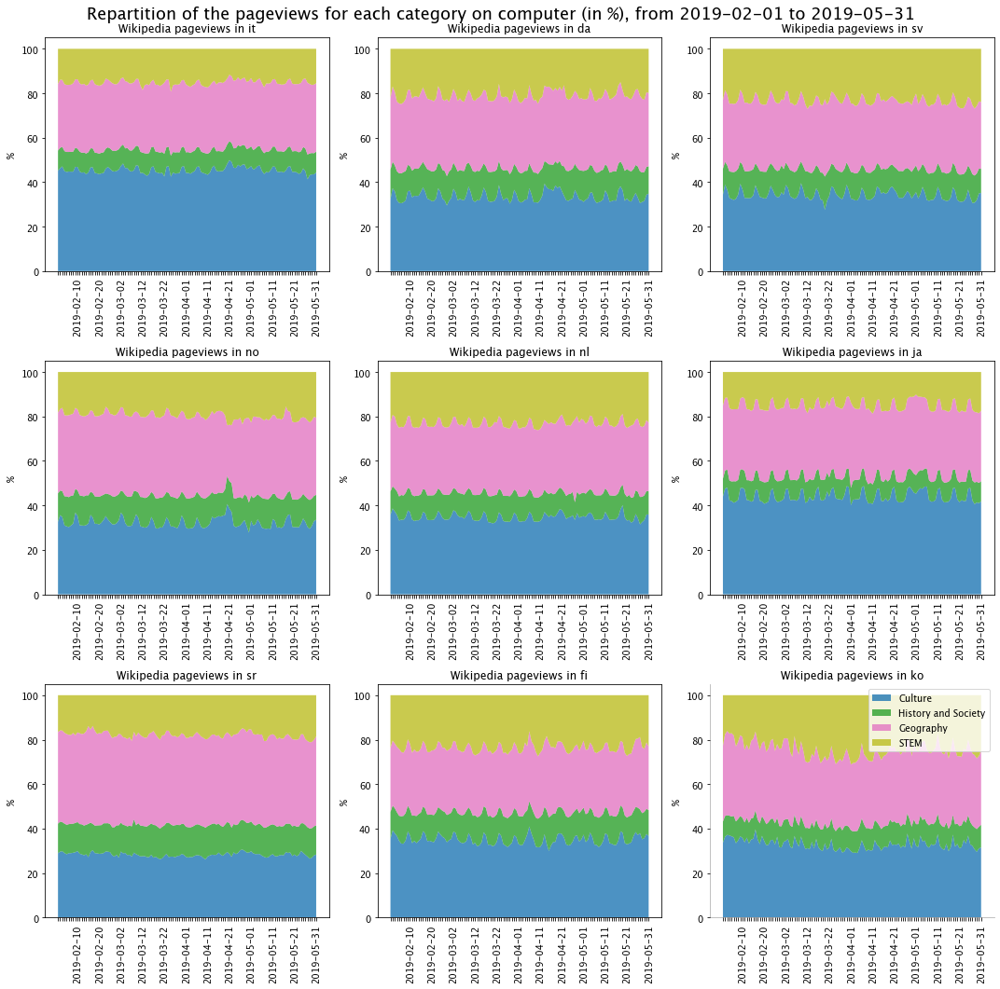

In [35]:
plot_percentage_views(languages, BEGIN_2019, END_2019, 'computer')

100%|█████████████████████████████████████████████| 9/9 [00:02<00:00,  3.43it/s]


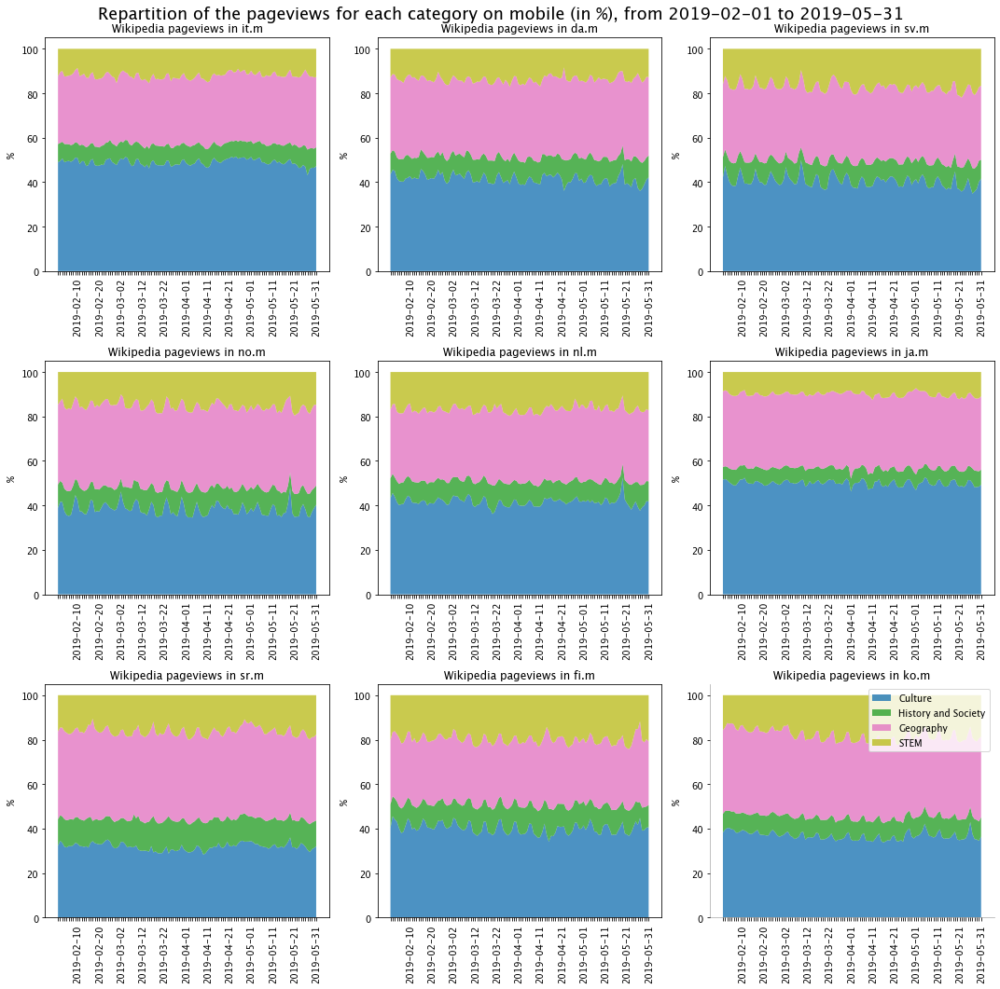

In [34]:
plot_percentage_views(languages_m, BEGIN_2019, END_2019, 'mobile')

100%|█████████████████████████████████████████████| 9/9 [00:02<00:00,  3.60it/s]


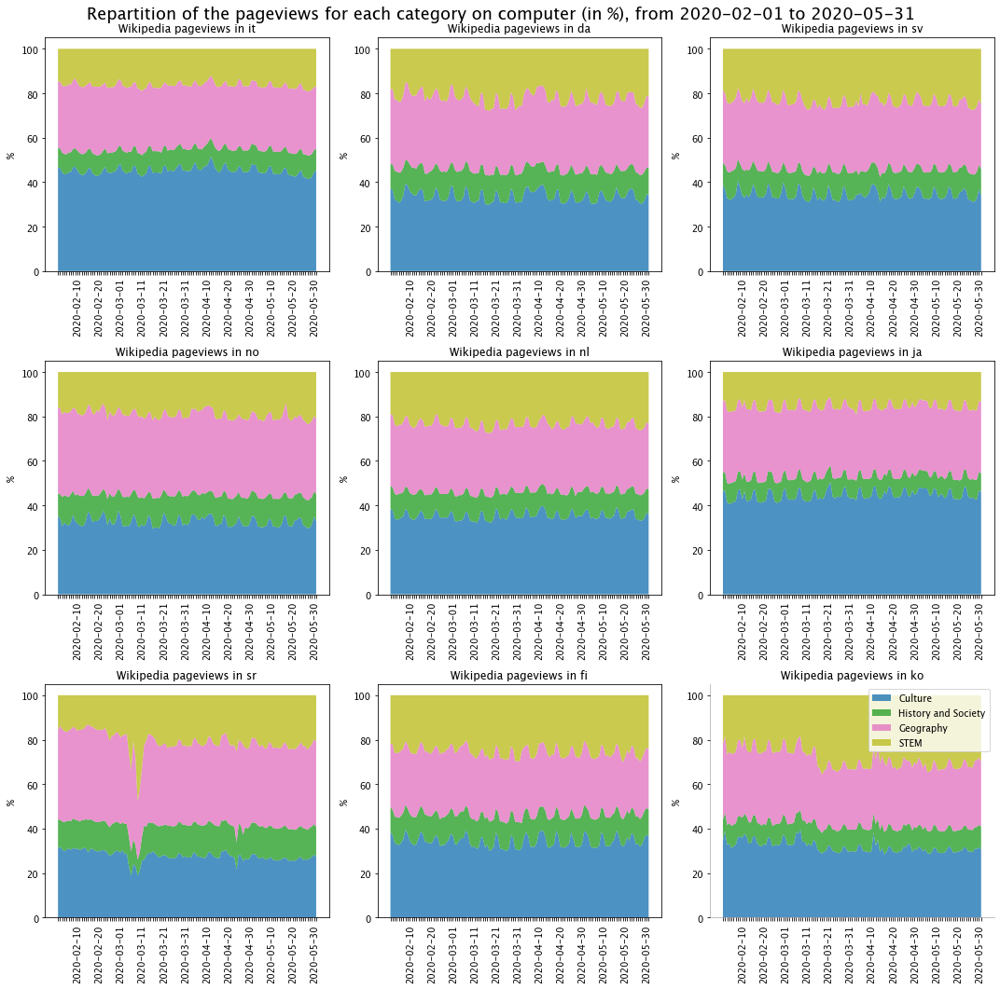

In [32]:
plot_percentage_views(languages, BEGIN_2020, END_2020, 'computer')

100%|█████████████████████████████████████████████| 9/9 [00:02<00:00,  3.56it/s]


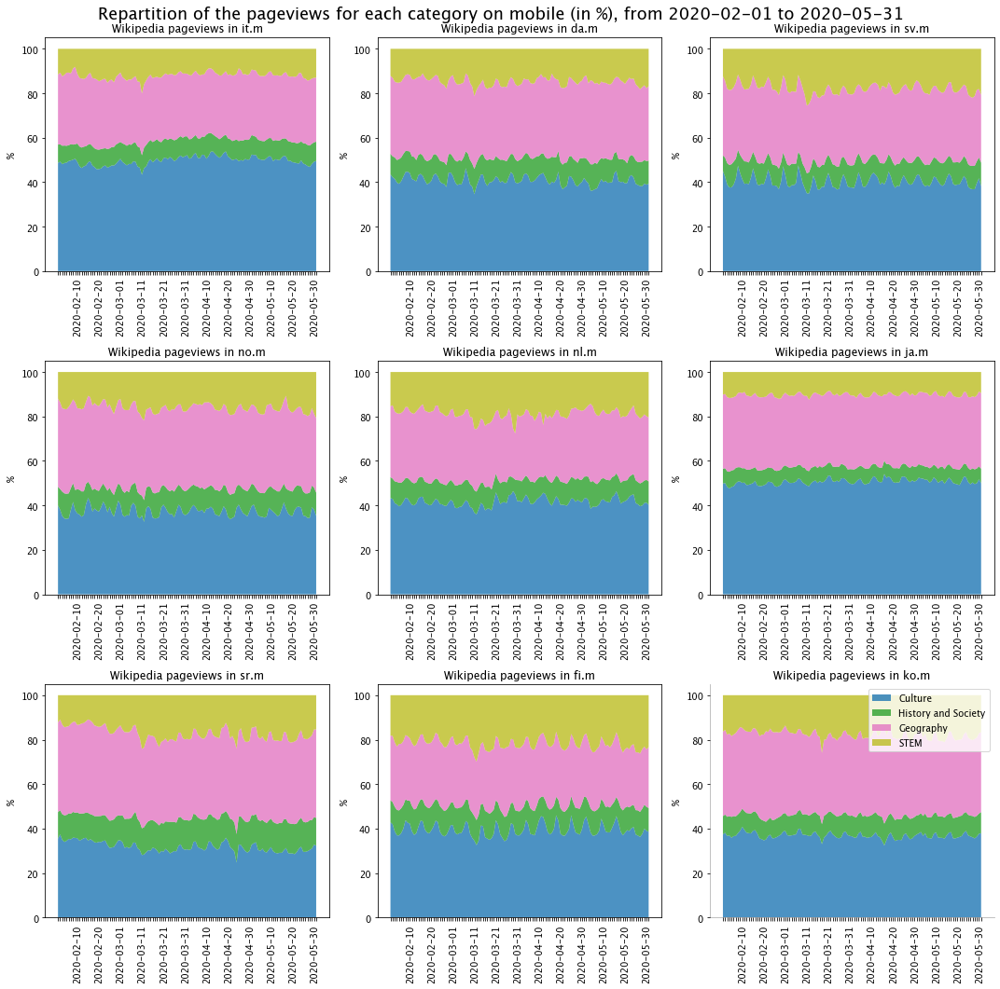

In [33]:
plot_percentage_views(languages_m, BEGIN_2020, END_2020, 'mobile')

### Observations 
on voit que la repartition varie plus en fonciton des workweek week end que a cuase du covid, on reste assez constant

### 2.1.2. Repartition of the views on mobile or desktop devices in the total Wikipedia pageviews in our languages of interest for a chosen period

In [39]:
'''
Here, we create a new dataframe giving the repartition of the views between mobile and desktop devices
(in %) for a given language. 
'''

def add_total_views_per_device(language) : 

    # Get the total pageviews on mobile and desktop. 
    df_language = pd.DataFrame 
    df_language_m = pd.DataFrame
    df_language = add_sum_and_percentage_categories(language)
    df_language_m = add_sum_and_percentage_categories(language + '.m')
    
    # Compute the percentage of utilization. 
    df_comp = df_language[['Date']].copy()
    df_comp['Date'] = df_comp['Date'].str[:10]
    df_comp['Total views'] = df_language['Total sum'] + df_language_m['Total sum']
    df_comp['Desktop perc views'] = (df_language['Total sum'] / df_comp['Total views']) * 100 
    df_comp['Mobile perc views'] = (df_language_m['Total sum'] / df_comp['Total views']) * 100 
    
    return df_comp

In [43]:
'''
Here, we plot for our 9 languages of interest the repartition in % between mobile and desktops pageviews.
We can choose the period we want to study with start_date and end_date. 
'''

def plot_comparison_mobile_desktop(start_date, end_date) : 
    
    # Initialize the plot. 
    fig, axes = plt.subplots(3,3, figsize=(15, 15), sharey=False)
    fig.suptitle('Repartition of the Wikipedia Views between Desktop and Mobile devices (in %), from ' + start_date + ' to ' + end_date, fontsize=18)
    
    labs = ['Desktop', 'Mobile']
    ax_x = 0 
    ax_y = 0

    # For each language we keep 
    for language in tqdm(languages) : 
        df_comp = pd.DataFrame 
        df_comp = add_total_views_per_device(language)
        df_comp = df_comp.loc[(df_comp['Date'] >= start_date) & (df_comp['Date'] <= end_date)]

        # Prepare data
        x  = df_comp['Date'].values.tolist()
        y0 = df_comp['Desktop perc views'].values.tolist()
        y1 = df_comp['Mobile perc views'].values.tolist()
        y = np.vstack([y0, y1])
        
        # Plot for each column
        axes[ax_x][ax_y].stackplot(x, y, labels=labs, colors=colors, alpha=0.8)
        
        # Decorations
        axes[ax_x][ax_y].set_title('Repartition of Wikipedia pageviews in ' + language, fontsize=12)
        displayed_date(df_comp, 12)
        axes[ax_x][ax_y].set_xticks(df_comp['Date'], df_comp['index_date'], rotation='vertical')
        axes[ax_x][ax_y].set_ylabel('%')
        
        if ax_x == 2 : 
            ax_x = 0 
            ax_y += 1
        else: 
            ax_x += 1
            
    # Lighten borders
    plt.gca().spines["top"].set_alpha(0)
    plt.gca().spines["bottom"].set_alpha(.3)
    plt.gca().spines["right"].set_alpha(0)
    plt.gca().spines["left"].set_alpha(.3)

    # We add the labels to our figure 
    plt.legend()
    plt.tight_layout()
    plt.show()

100%|█████████████████████████████████████████████| 9/9 [00:10<00:00,  1.19s/it]


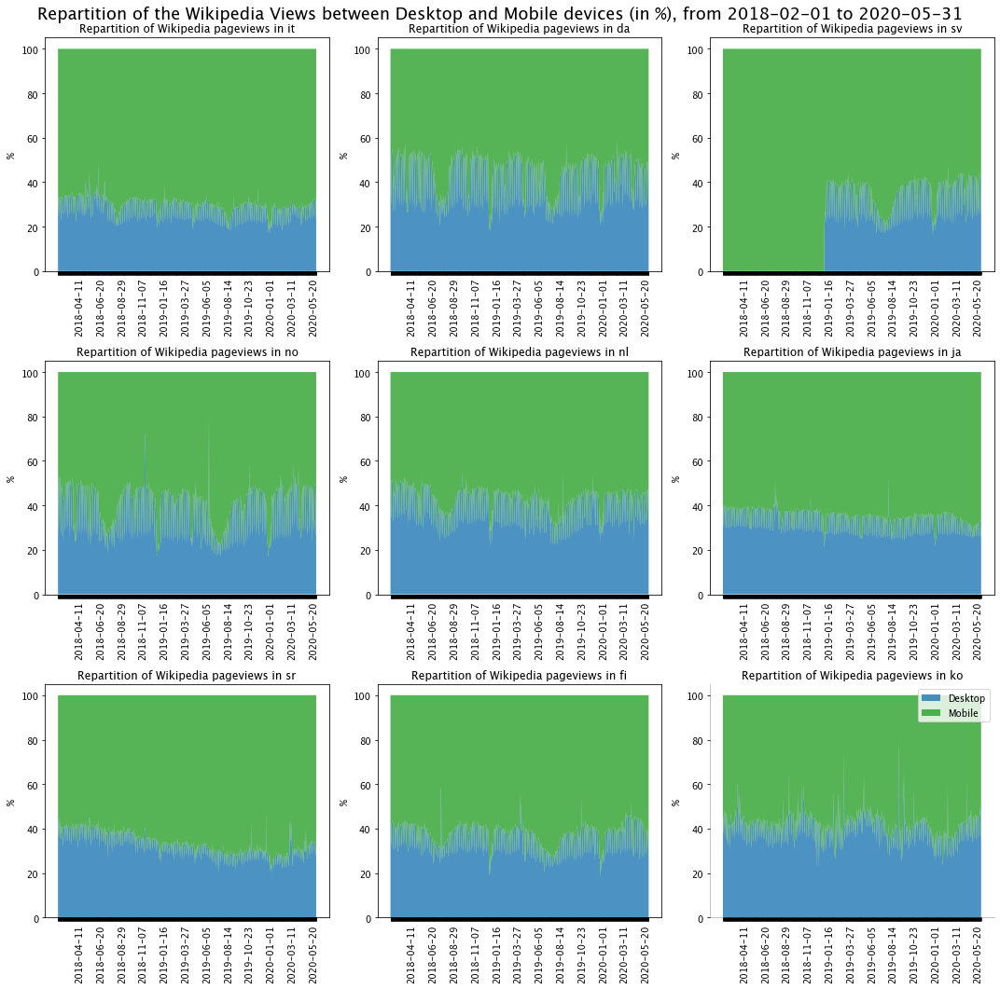

In [45]:
plot_comparison_mobile_desktop(BEGIN_2018, END_2020) 

trend a l'oeil nu :
- plus en plus de mobile 
- trends des vacances
- dire suède pour debut des valeurs qui manquent

100%|█████████████████████████████████████████████| 9/9 [00:03<00:00,  2.86it/s]


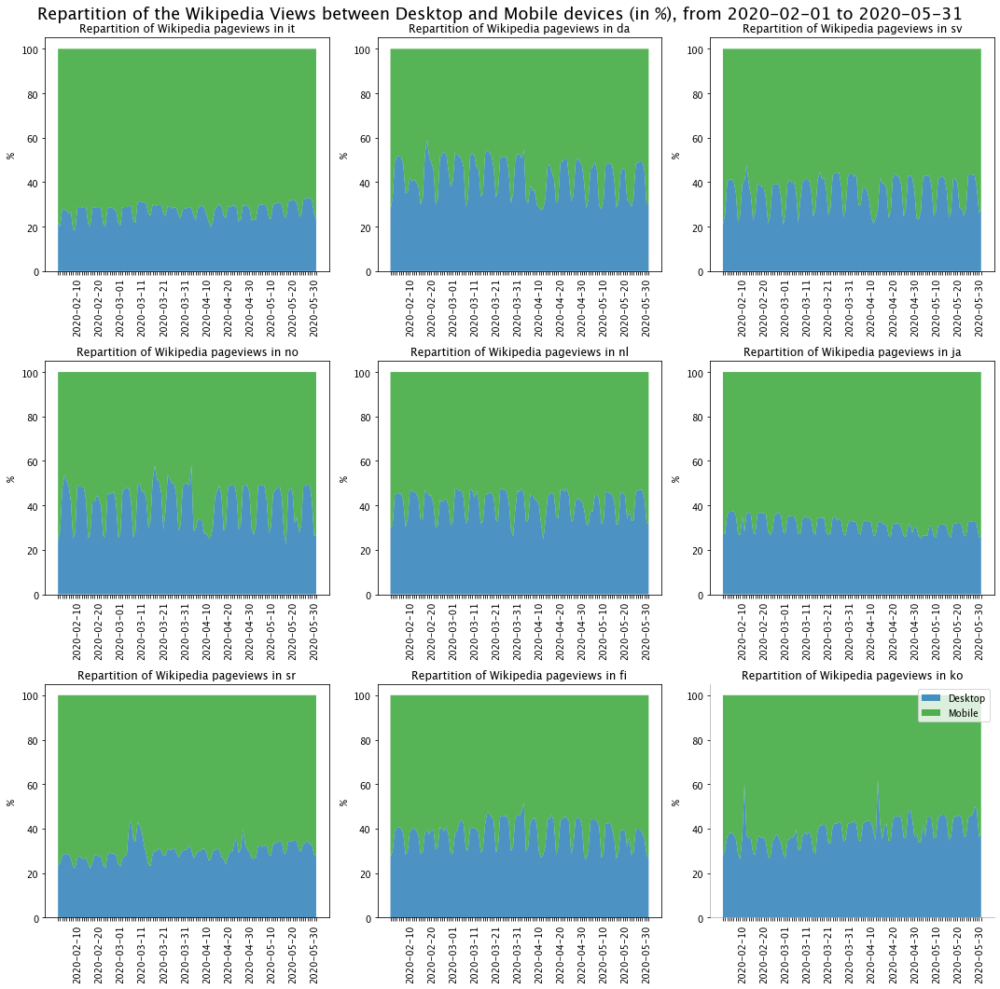

In [46]:
plot_comparison_mobile_desktop(BEGIN_2020, END_2020) 

important to keep in mind that: 
- in % 
- tous topics confondus 
On voit pas mal la semaine partout

### 2.1.3. Evolution of the views for each category in our languages of interest for a chosen period, between desktop and mobile devices

In [47]:
'''
Create a new dataframe with the sum of pageviews for each catoegroy for all languages
'''
def get_all_categories_for_all_languages(languages) : 
    
    df_final = pd.DataFrame
    
    # Initilization of dataframe
    df_init_dates = pd.DataFrame.from_dict(wikipedia['ja.m']['topics']['STEM.Space']['sum'].items()) # Here we take ja.m and STEM.Space as arbitrary references
    df_init_dates.columns = ['Date', 'STEM.Space']
    df_final = df_init_dates[['Date']].copy()
    
    df_final['Date'] = df_final['Date'].str[:10]
    
    # Copy the sum for each category for each language
    for language in languages: 
        df_language = add_sum_and_percentage_categories(language)
        
        df_final.insert(1, 'Cult ' +language, df_language['Sum Culture'], True)
        df_final.insert(1, 'Geo ' +language, df_language['Sum Geography'], True)
        df_final.insert(1, 'His ' +language, df_language['Sum History and Society'], True)
        df_final.insert(1, 'STEM ' +language, df_language['Sum STEM'], True) 
        
    
    return df_final

In [100]:
'''
Function that displays 2 plots per language (mobile devices and desktop devices) for each language. 
It displays the distribution of the number of pageviews per day for the 4 categories.
'''

def plot_topics(start_date, end_date, nbre_ticks):
    
    fig, axes = plt.subplots(9, 2, figsize=(20, 60), constrained_layout = True)
    fig.suptitle('Evolution of the number of views for each category from ' + start_date + ' to ' + end_date, fontsize=20)
    
    loc = 1
    
    df_all_categories_for_all_languages = get_all_categories_for_all_languages(all_languages)
    df = df_all_categories_for_all_languages.loc[(df_all_categories_for_all_languages['Date'] >= start_date) & (df_all_categories_for_all_languages['Date'] <= end_date)]
    
    displayed_date(df, nbre_ticks)
    
    for lan in all_languages:
        plt.subplot(9,2,loc)
        plt.plot(df['Date'], df['Cult '+lan], label="Culture", color=colors[0])
        plt.plot(df['Date'], df['Geo '+lan], label="Geography", color=colors[1])
        plt.plot(df['Date'], df['His '+lan], label="History", color=colors[2])
        plt.plot(df['Date'], df['STEM '+lan], label="STEM", color=colors[3])
        plt.legend(loc='upper left')
        plt.xticks(df['Date'], df['index_date'], rotation='vertical')
        plt.xlabel(' ', fontsize=13)
        plt.ylabel('Number of pageviews', fontsize=13)
        plt.title(lan, fontsize=15)
        loc = loc+1

    return plt.show()

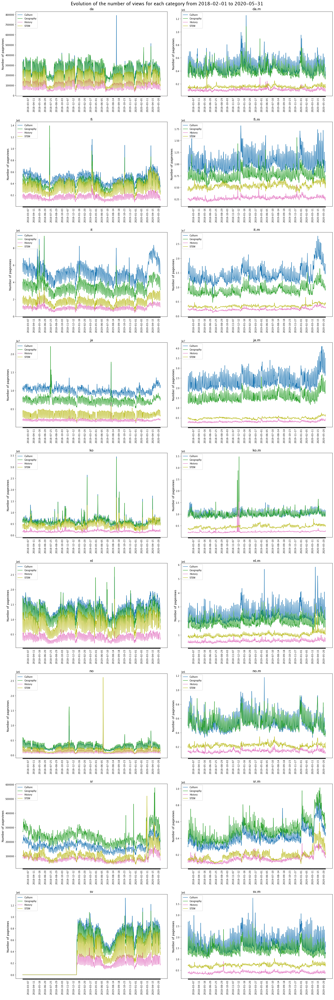

In [101]:
# Distributions from 2018 to 2020
plot_topics(BEGIN_2018, END_2020, 24)

**Observations**

pareil 2018 et 2019, on voit bien les saisons 

gros pics pour certains pays en 2020 à cause des restrictions dues au covid 

pas ordi en vacances donc diminution dans certains pays (lesquels)  //
mobile pas affecté 


on retrouve le pattern des vacances comme pour les graphs de pourcentage au dessus

We plot and hide below the details for 2018 and 2019 for our period of interest between February and May.

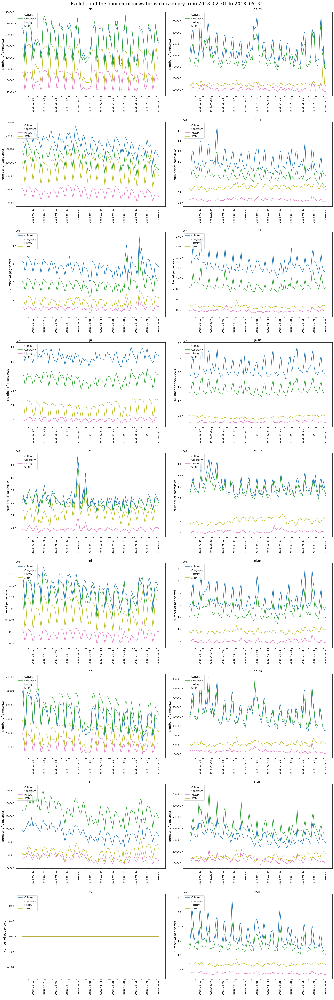

In [102]:
# Distributions in 2018
plot_topics(BEGIN_2018, END_2018, 12)

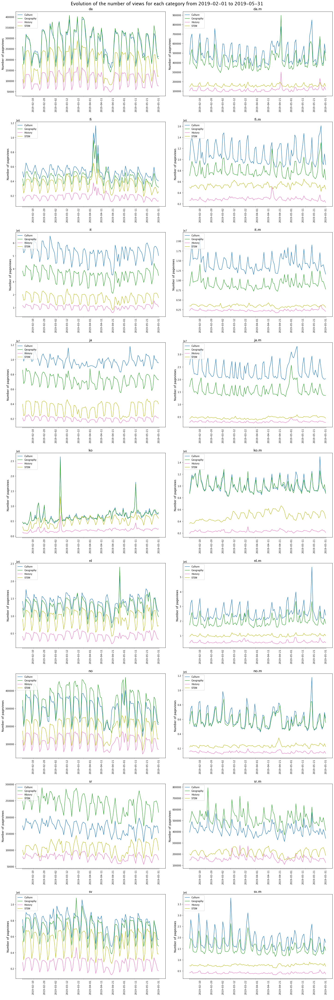

In [103]:
# Distributions in 2019
plot_topics(BEGIN_2019, END_2019, 12)

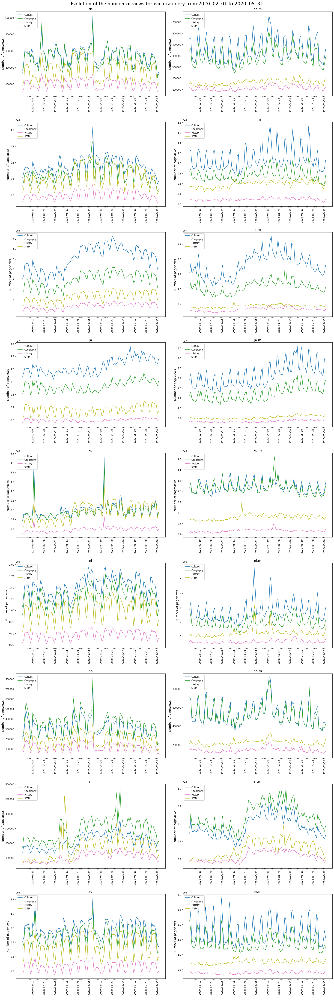

In [104]:
# Distributions in 2020
plot_topics(BEGIN_2020, END_2020, 12)

**Observations**

dans certains pays, augmentation de la consultation de certaines categories à cuase des restrictions mises en place par les gouvernements.

## 2.2. Mobility dataset

In [57]:
mobility.head()

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
0,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-15,0.0,4.0,5.0,0.0,2.0,1.0
1,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-16,1.0,4.0,4.0,1.0,2.0,1.0
2,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-17,-1.0,1.0,5.0,1.0,2.0,1.0
3,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-18,-2.0,1.0,5.0,0.0,2.0,1.0
4,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-19,-2.0,0.0,4.0,-1.0,2.0,1.0


In [58]:
list_of_places = ['retail_and_recreation', 'grocery_and_pharmacy', 'parks', 'transit_stations', 'workplaces', 'residential', ]

9it [00:10,  1.22s/it]


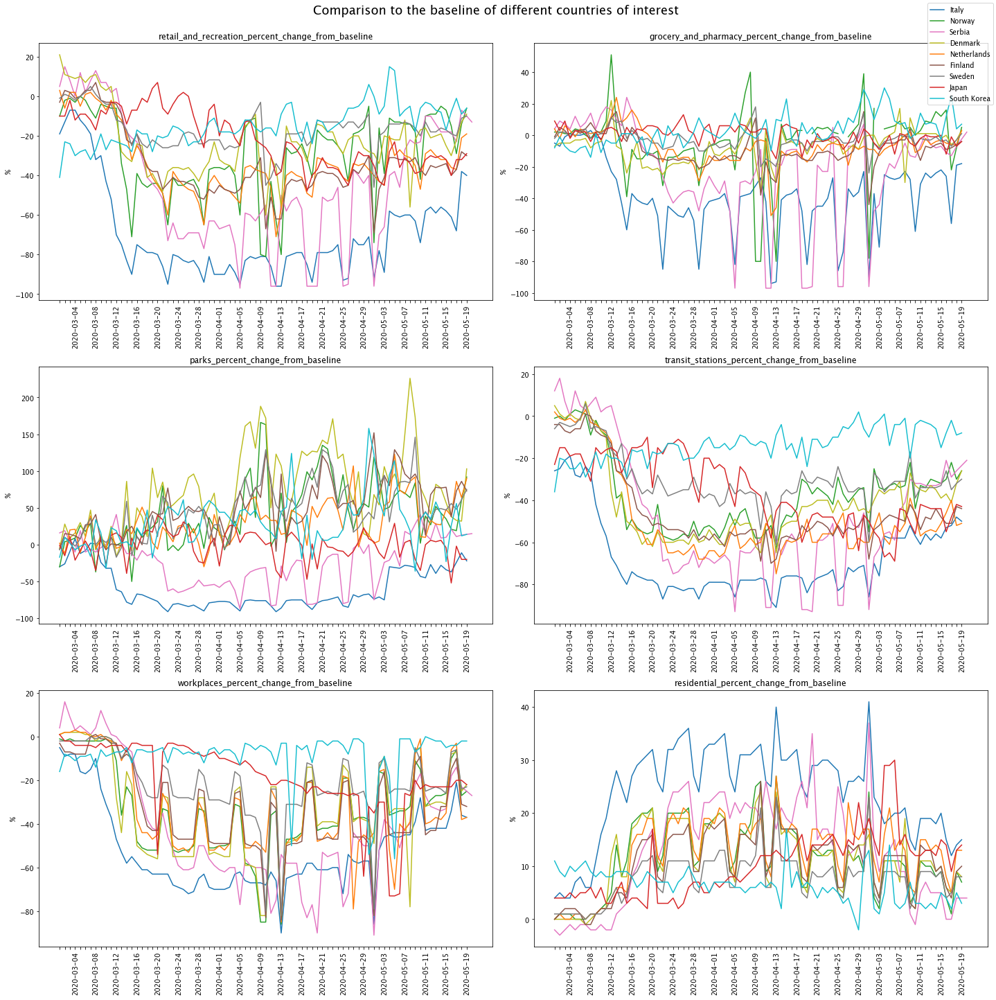

In [79]:
# We initialize our final figure
fig, axes = plt.subplots(3, 2, figsize=(20, 20), sharey=False)
fig.suptitle('Comparison to the baseline of different countries of interest', fontsize=18, y = 1)

axes[0][0].title.set_text('retail_and_recreation_percent_change_from_baseline')
axes[0][1].title.set_text('grocery_and_pharmacy_percent_change_from_baseline')
axes[1][0].title.set_text('parks_percent_change_from_baseline')
axes[1][1].title.set_text('transit_stations_percent_change_from_baseline')
axes[2][0].title.set_text('workplaces_percent_change_from_baseline')
axes[2][1].title.set_text('residential_percent_change_from_baseline')

for country, color in tqdm(zip(countries, colors)) :
    df_temp = pd.DataFrame 
    df_temp = mobility.loc[mobility['country_region'].str.contains(country, case=False)]
    df_temp = df_temp.reset_index()
    df_temp = df_temp.drop(['index'], axis=1)
    df_temp = df_temp.iloc[15:95]
    df_temp['Date'] = df_temp['date']
    #df_temp = df_temp.drop(['date'])
    
    displayed_date(df_temp, 20)
    
    axes[0][0].plot(df_temp['Date'], df_temp['retail_and_recreation_percent_change_from_baseline'], color=color, label=country)
    axes[0][1].plot(df_temp['Date'], df_temp['grocery_and_pharmacy_percent_change_from_baseline'], color=color, label=country)
    axes[1][0].plot(df_temp['Date'], df_temp['parks_percent_change_from_baseline'], color=color, label=country)
    axes[1][1].plot(df_temp['Date'], df_temp['transit_stations_percent_change_from_baseline'], color=color, label=country)
    axes[2][0].plot(df_temp['Date'], df_temp['workplaces_percent_change_from_baseline'], color=color, label=country)
    axes[2][1].plot(df_temp['Date'], df_temp['residential_percent_change_from_baseline'], color=color, label=country)

    axes[0][0].set_xticks(df_temp['Date'], df_temp['index_date'], rotation='vertical')
    axes[0][1].set_xticks(df_temp['Date'], df_temp['index_date'], rotation='vertical')
    axes[1][0].set_xticks(df_temp['Date'], df_temp['index_date'], rotation='vertical')
    axes[1][1].set_xticks(df_temp['Date'], df_temp['index_date'], rotation='vertical')
    axes[2][0].set_xticks(df_temp['Date'], df_temp['index_date'], rotation='vertical')
    axes[2][1].set_xticks(df_temp['Date'], df_temp['index_date'], rotation='vertical')
    
    axes[0][0].set_ylabel('%')
    axes[0][1].set_ylabel('%')
    axes[1][0].set_ylabel('%')
    axes[1][1].set_ylabel('%')
    axes[2][0].set_ylabel('%')
    axes[2][1].set_ylabel('%')

    
# We add the labels to our figure 
handles, labels = axes[0][0].get_legend_handles_labels()
fig.legend(handles, labels)
    
plt.tight_layout()
plt.show()

Globalement = decrease pout tout sauf residential ou ca augmente

on voit bien al distinction entre pays ou lockdown et pays pas lockdown

In [ ]:
'''
Here, we plot for our 9 countries of interest the percentage change from baseline for a certain type of 
place (chosen in the list above), for a chosen period of time.
'''

def plot_percent_change_from_baseline(place, start_date, end_date) :
    fig, axes = plt.subplots(3,3, figsize=(15, 15), sharey=False)
    fig.suptitle('Study of the ' + place + ' percent change from baseline')
    ax_x = 0 
    ax_y = 0

    # Get the values for each country 
    for country, color in tqdm(zip(countries, colors)) :
        df_temp = pd.DataFrame 
        df_temp = mobility.loc[mobility['country_region'].str.contains(country, case=False)]
        df_temp = df_temp.reset_index()
        df_temp = df_temp.drop(['index'], axis=1)
        df_temp = df_temp.iloc[0:193] # Here we only keep the lines that correspond to the country in its globality. 
        df_temp = df_temp.loc[(df_temp['date'] >= start_date) & (df_temp['date'] <= end_date)]

        # Plot the changes from baseline. 
        axes[ax_x][ax_y].plot(df_temp['date'], df_temp[place + '_percent_change_from_baseline'], color=color)
        axes[ax_x][ax_y].title.set_text(country)

        if ax_x == 2 : 
            ax_x = 0 
            ax_y += 1
        else: 
            ax_x += 1

    # We add the labels to our figure 
    plt.legend()
    plt.tight_layout()
    plt.show()

This dataset will be used more in depth in our follow-up analysis to determine the period on which we would like to focus. We have the idea of...

# 3. First analysis

## 3.1. Patterns in Wikipedia usage

First, we would like to determine the pattern with which people use Wikipedia. From our plots above, we have the intuition that we will have a weekly pattern. 

Our current process consists of using autocorrelation to identify patterns in different languages. 


In [80]:
'''
For a given category, between a start and end dates, for our 9 languages of interest, we do some 
autocorrelation with the pageviews for each day to extract patterns in the usage of Wikipedia. 
We plot mobile and desktop patterns on the same graph for a same language to be able to compare them.

'''


def plot_autocorrelations(category, start_date, end_date) :
    
    # Initialize our plot. 
    fig, ax = plt.subplots(3,3, figsize=(15, 15), sharey=False)
    fig.suptitle('Study of the following topic: ' + category + ' from ' + start_date + ' to ' + end_date )
    ax_x = 0 
    ax_y = 0
    
    for language, language_m in zip(languages, languages_m) : 
        # We get the total number of views for each language on desktop and mobile devices.       
        df_final = add_sum_and_percentage_categories(language)
        df_final_m = add_sum_and_percentage_categories(language_m)

        # We only keep the period we are interested in. 
        df_to_plot = df_final.loc[(df_final['Date'] >= start_date) & (df_final['Date'] <= end_date)]
        df_to_plot_m = df_final_m.loc[(df_final_m['Date'] >= start_date) & (df_final_m['Date'] <= end_date)]
        
        # We plot the autocorrelations for computer and mobile devices for the category chosen. 
        plot_acf(df_to_plot['Sum ' +category], ax=ax[ax_x][ax_y], label='computer', color='blue', title=language)
        plot_acf(df_to_plot_m['Sum ' +category], ax=ax[ax_x][ax_y], label='mobile', color='pink', title=language)
        
        if ax_x == 2 : 
            ax_x = 0 
            ax_y += 1
        else: 
            ax_x += 1
        
    # We add the labels to our figure 
    plt.legend()
    plt.tight_layout()
    plt.show()

Using the function *plot_autocorrelations*, we can see the autocorrelations over our nine languages of interest, for a period of our choice and a chosen category. We distinguish the results between Wikipedia pages seen on mobile devices and desktop devices. Below, we display our results for the category 'STEM'. 

Our study period is from the beginning of February until the end of May, as it corresponds for most our countries to the peak Covid period. The period will be affined later on.

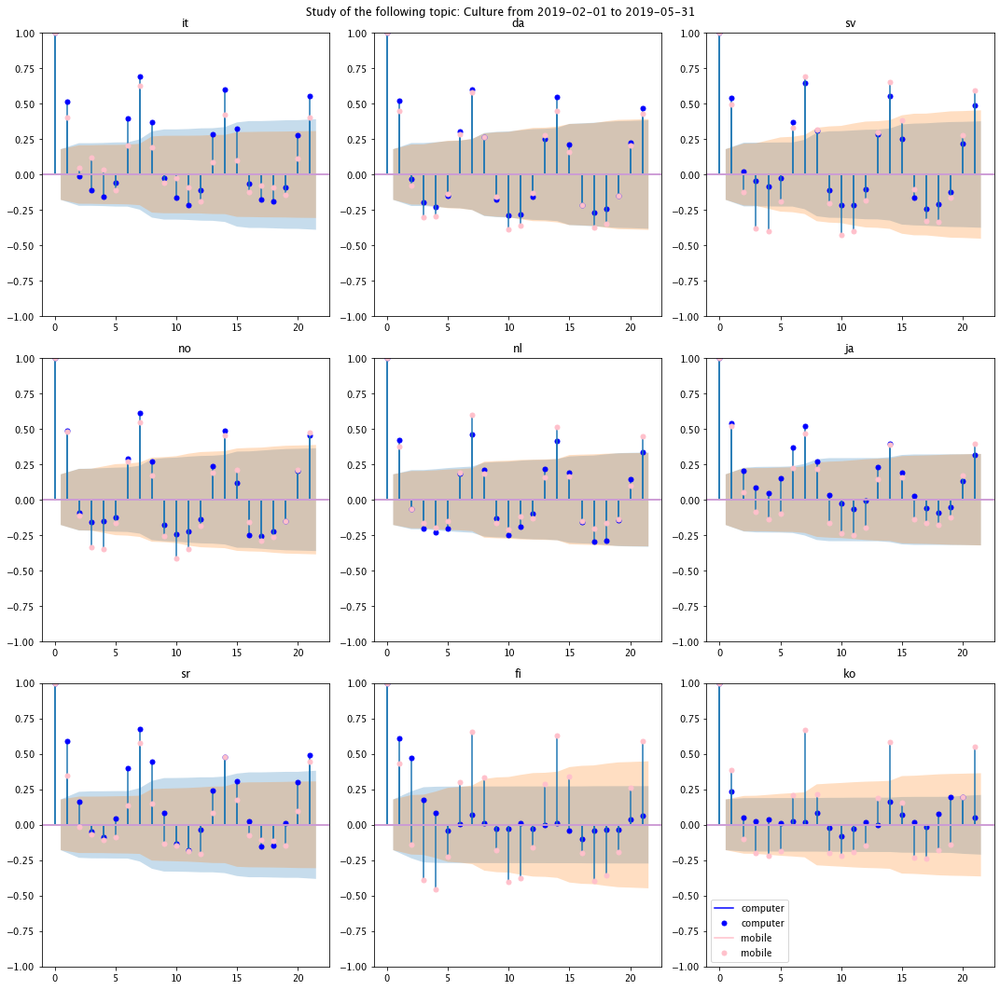

In [86]:
plot_autocorrelations(category = 'Culture', start_date = BEGIN_2019, end_date = END_2019)

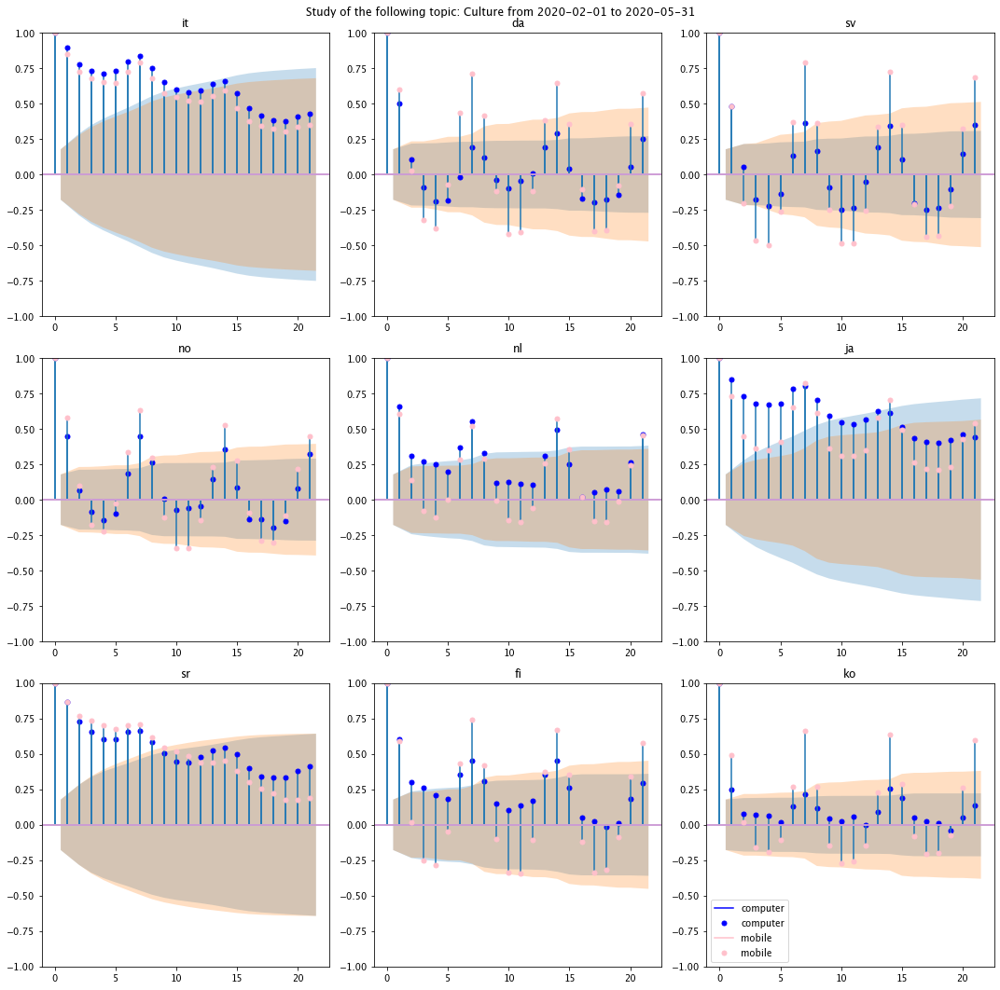

In [87]:
plot_autocorrelations(category = 'Culture', start_date = BEGIN_2020, end_date = END_2020)

With these plots, we get peaks at lags k = 7*n, meaning that we see a repetitive pattern every week. We interpret this as the week being a good describer of habits. We only proceed with countries that have these peaks every 7 lags. (For the moment, they nearly all satisfy this condition).

Detaol sur plus de pattern en 2019 qu'en 2020.

check si pour des categories moins de changeemnt de patterns

conclure sur l'utilisation du pattern de semaine

For the sake of not overcrowding this notebook, we do not display more graphs but we could choose from any category, for a given period in 2018, 2019 and 2020.

## 3.2. Workweek vs Weekend

Now that we know that we have mostly a weekly pattern, the next step is to differentiate the different days within the week to and see if, for example, the average monday is the same as the average tuesday. 
Our intuition is that the average Monday = average Tuesday = average Wednesday = average Thursday = average Friday but not equal to average Saturday or Sunday. 

In the aim to find if there is a difference of consultation during the work week and weekend, we do a t-test between each week days over a 4 month period. (ex: t test of Mondays with Tuesdays, t test of Mondays with Wednesday…) to find the days that have approximately the same mean volume search. 

**Statistic tests over days of the week**

In this part, the aim is to see if a pattern can be detected within the week and if certain days are more similar to each other (for example workdays and week-end days). 
To do so, we decide to compute t-test between days of the week. 

For a certain period of the year, the procedure is as follows :
- **Standardize the data for each language** (substract the mean of the total number of pageviews over the period to each day total number of pageviews and then divide for each day, the total number of pageviews by the standard deviation of the column).
The aim of this standardisation is to create new variables whose distribution is better known. 
- Then, we select each day of the week, we **make a t-test** with between them and we consider a threshold of 5%.
- If the p-value is greater than 5%, the 2 independent samples have identical average (expected) values and so we can consider that 2 different days of the week are "the same" or at least belong to the same group. Otherwise, the null hypothesis is rejected and we consider that the 2 different days belong to different groups.

**Note**: We are aware that standardisation is not enough to remove all trends and that certainly cofounders play a role in the outcome of our data (holidays, periods of the year). We are thinking about other methods for the future that would allow us to cancel or strongly reduce these effects.

In [88]:
# We have only the date in the wikipedia dataset 
# We import a .csv file containing the day of the week which corresponds to the date
df_date = pd.read_csv(DATE_TO_DAY_DATASET)
df_date = df_date['Date;Day'].str.split(pat=';',expand=True)
df_date.columns =['Date', 'Day']
df_date.head(2)

,Date,Day
0,2018-01-01,MON
1,2018-01-02,TUE


In [105]:
'''
Function that allows to color texts based on some if conditions

''' 
def _color_red_or_green(val):
    color = 'green' if val > 0.05 else 'red'
    return 'background-color: %s' % color

### 3.2.1. Statistical tests for all pageviews of Wikipedia, all categories combined, for each language

In [91]:
# Merging the total number of pageviews for each language from the original dataframe data 
# to the dataframe containing the date and the corresponding day of the week

df_all_views_per_language = df_date.copy()
df_all_views_per_language['Date'] = df_all_views_per_language['Date'].str[:10]

# For each language, we add to a new colum of our dataframe 'df_nbre_views' the total number of pageviews per day
for l in all_languages: 
    
    # We need to convert the dictionnary into a dataframe and we only keep the elements in column [1] 
    # for each row which represent the total number of pageviews of each day
    df_all_views_per_language[l] = pd.DataFrame.from_dict(wikipedia[l]['sum'].items())[1]
    
df_all_views_per_language.head(3)

,Date,Day,da,da.m,fi,fi.m,it,it.m,ja,ja.m,ko,ko.m,nl,nl.m,no,no.m,sr,sr.m,sv,sv.m
0,2018-01-01,MON,206514,765123,523135,1319053,3338750,12856884,7828155,22328288,819174,1484496,1199379,3331046,224417,715031,192409,451383,0,2383474
1,2018-01-02,TUE,322681,443384,648344,1094280,5428428,12887390,8759385,22278953,959239,1248031,1926749,2494738,374771,536506,253653,462824,0,1873096
2,2018-01-03,WED,396756,415545,644605,1022615,5640812,12859488,9996156,23632758,1037688,1182592,2041636,2493955,459743,552379,272278,404880,0,1863012


In [106]:
'''
Function that calculates for each language, the p-value between each day of the week.
In output, it displays a dataframe that contains all these p-values.
If the cell is green, it means that the 2 related days seem to have identical average value. 
Otherwise the cell is red. 
'''

def p_values_days(df_start, start_date, end_date, columns):
    
    # We get only the period we are interested in 
    df_temp = df_start.loc[(df_start['Date'] >= start_date) & (df_start['Date'] <= end_date)]
    
    # We standardise our columns
    df = df_temp.copy()
    # For each column in the dataframe, we substract from each cell the mean of the column 
    # and divide each cell by the standard deviation of the column
    for col in columns:
        df[col] = StandardScaler().fit_transform(np.array(df_temp[col]).reshape(-1,1))
    
    # Initialize an empty dataframe that will stock the p-values of each language
    p_values = pd.DataFrame()

    # For each language in the dataframe 
    # We compare one day of the week with all the other one by calculating the p-value, and we do this for all the days
    for col in columns:
        for d in days:
            p_values_temp = []
            for count in range(7):
                p_values_temp.append(stats.ttest_ind(df.loc[(df['Day'] == d)][col],df.loc[(df['Day'] == days[count])][col]).pvalue)

            df_temp = pd.DataFrame(p_values_temp)
            df_temp.columns = [d + ' ' + col]
            p_values = pd.concat([p_values, df_temp], axis=1)
            
    # Rename the number rows with the day of the week
    p_values.rename(index = {0: 'MON', 1: 'TUE', 2: 'WED', 3: 'THU', 4: 'FRI', 5: 'SAT', 6: 'SUN'}, inplace = True)

    return p_values.style.applymap(_color_red_or_green)

In [109]:
# 2018
df_p_values = p_values_days(df_all_views_per_language, BEGIN_2018, END_2018, all_languages)
df_p_values

,MON da,TUE da,WED da,THU da,FRI da,SAT da,SUN da,MON da.m,TUE da.m,WED da.m,THU da.m,FRI da.m,SAT da.m,SUN da.m,MON fi,TUE fi,WED fi,THU fi,FRI fi,SAT fi,SUN fi,MON fi.m,TUE fi.m,WED fi.m,THU fi.m,FRI fi.m,SAT fi.m,SUN fi.m,MON it,TUE it,WED it,THU it,FRI it,SAT it,SUN it,MON it.m,TUE it.m,WED it.m,THU it.m,FRI it.m,SAT it.m,SUN it.m,MON ja,TUE ja,WED ja,THU ja,FRI ja,SAT ja,SUN ja,MON ja.m,TUE ja.m,WED ja.m,THU ja.m,FRI ja.m,SAT ja.m,SUN ja.m,MON ko,TUE ko,WED ko,THU ko,FRI ko,SAT ko,SUN ko,MON ko.m,TUE ko.m,WED ko.m,THU ko.m,FRI ko.m,SAT ko.m,SUN ko.m,MON nl,TUE nl,WED nl,THU nl,FRI nl,SAT nl,SUN nl,MON nl.m,TUE nl.m,WED nl.m,THU nl.m,FRI nl.m,SAT nl.m,SUN nl.m,MON no,TUE no,WED no,THU no,FRI no,SAT no,SUN no,MON no.m,TUE no.m,WED no.m,THU no.m,FRI no.m,SAT no.m,SUN no.m,MON sr,TUE sr,WED sr,THU sr,FRI sr,SAT sr,SUN sr,MON sr.m,TUE sr.m,WED sr.m,THU sr.m,FRI sr.m,SAT sr.m,SUN sr.m,MON sv,TUE sv,WED sv,THU sv,FRI sv,SAT sv,SUN sv,MON sv.m,TUE sv.m,WED sv.m,THU sv.m,FRI sv.m,SAT sv.m,SUN sv.m
MON,1.000000,0.645650,0.873726,0.376606,0.000833,0.000000,0.000000,1.000000,0.190082,0.129577,0.286974,0.807965,0.000017,0.000001,1.000000,0.624330,0.253993,0.031038,0.000011,0.000000,0.000000,1.000000,0.271009,0.008647,0.002150,0.023287,0.003326,0.000000,1.000000,0.396492,0.476938,0.436109,0.023704,0.000001,0.000021,1.000000,0.546014,0.187991,0.004638,0.000003,0.912794,0.000000,1.000000,0.548286,0.220236,0.062190,0.001291,0.000000,0.000000,1.000000,0.007174,0.085210,0.014132,0.026433,0.005261,0.000000,1.000000,0.938077,0.385753,0.631610,0.000074,0.000000,0.000000,1.000000,0.386299,0.049495,0.001268,0.000282,0.222339,0.000003,1.000000,0.553563,0.497305,0.223208,0.000060,0.000000,0.000000,1.000000,0.060484,0.103593,0.110659,0.200691,0.008550,0.000000,1.000000,0.944450,0.849462,0.511114,0.003831,0.000000,0.000000,1.000000,0.309762,0.050959,0.526449,0.683304,0.000035,0.000001,1.000000,0.974360,0.325904,0.090586,0.001016,0.000001,0.019819,1.000000,0.289790,0.051653,0.021174,0.012799,0.438831,0.000192,nan,nan,nan,nan,nan,nan,nan,1.000000,0.391620,0.032890,0.117444,0.018865,0.000000,0.000000
TUE,0.645650,1.000000,0.778622,0.154057,0.000038,0.000000,0.000000,0.190082,1.000000,0.809600,0.999887,0.092540,0.000000,0.000000,0.624330,1.000000,0.523940,0.079931,0.000030,0.000000,0.000000,0.271009,1.000000,0.083341,0.022644,0.181467,0.000035,0.000000,0.396492,1.000000,0.925387,0.951442,0.006149,0.000000,0.000000,0.546014,1.000000,0.566447,0.062762,0.000455,0.623834,0.000001,0.548286,1.000000,0.412344,0.104986,0.000759,0.000000,0.000000,0.007174,1.000000,0.346494,0.967358,0.931656,0.000000,0.000000,0.938077,1.000000,0.388209,0.676289,0.001604,0.000000,0.000000,0.386299,1.000000,0.369647,0.045517,0.008271,0.868770,0.000001,0.553563,1.000000,0.159197,0.057838,0.000001,0.000000,0.000000,0.060484,1.000000,0.837905,0.909944,0.407304,0.000001,0.000000,0.944450,1.000000,0.776831,0.448330,0.001159,0.000000,0.000000,0.309762,1.000000,0.345978,0.826281,0.241417,0.000002,0.000000,0.974360,1.000000,0.384306,0.140150,0.003658,0.000010,0.035599,0.289790,1.000000,0.355576,0.165039,0.069313,0.959700,0.000012,nan,nan,nan,nan,nan,nan,nan,0.391620,1.000000,0.265893,0.620568,0.002652,0.000000,0.000000
WED,0.873726,0.778622,1.000000,0.298362,0.000500,0.000000,0.000000,0.129577,0.809600,1.000000,0.858124,0.056785,0.000000,0.000000,0.253993,0.523940,1.000000,0.189061,0.000032,0.000000,0.000000,0.008647,0.083341,1.000000,0.424130,0.745783,0.000000,0.000000,0.476938,0.925387,1.000000,0.972179,0.033904,0.000000,0.000002,0.187991,0.566447,1.000000,0.160126,0.000842,0.243726,0.000000,0.220236,0.412344,1.000000,0.360109,0.005877,0.000000,0.000000,0.085210,0.346494,1.000000,0.407313,0.506038,0.000002,0.000000,0.385753,0.388209,1.000000,0.312846,0.013574,0.000011,0.000120,0.049495,0.369647,1.000000,0.209387,0.033486,0.372538,0.000000,0.497305,0.159197,1.000000,0.527943,0.000220,0.000000,0.000000,0.103593,0.837905,1.000000,0.805014,0.589989,0.000006,0.000000,0.849462,0.776831,1.00000

In [94]:
# 2019
p_values_days(df_all_views_per_language, BEGIN_2019, END_2019, all_languages)

,MON da,TUE da,WED da,THU da,FRI da,SAT da,SUN da,MON da.m,TUE da.m,WED da.m,THU da.m,FRI da.m,SAT da.m,SUN da.m,MON fi,TUE fi,WED fi,THU fi,FRI fi,SAT fi,SUN fi,MON fi.m,TUE fi.m,WED fi.m,THU fi.m,FRI fi.m,SAT fi.m,SUN fi.m,MON it,TUE it,WED it,THU it,FRI it,SAT it,SUN it,MON it.m,TUE it.m,WED it.m,THU it.m,FRI it.m,SAT it.m,SUN it.m,MON ja,TUE ja,WED ja,THU ja,FRI ja,SAT ja,SUN ja,MON ja.m,TUE ja.m,WED ja.m,THU ja.m,FRI ja.m,SAT ja.m,SUN ja.m,MON ko,TUE ko,WED ko,THU ko,FRI ko,SAT ko,SUN ko,MON ko.m,TUE ko.m,WED ko.m,THU ko.m,FRI ko.m,SAT ko.m,SUN ko.m,MON nl,TUE nl,WED nl,THU nl,FRI nl,SAT nl,SUN nl,MON nl.m,TUE nl.m,WED nl.m,THU nl.m,FRI nl.m,SAT nl.m,SUN nl.m,MON no,TUE no,WED no,THU no,FRI no,SAT no,SUN no,MON no.m,TUE no.m,WED no.m,THU no.m,FRI no.m,SAT no.m,SUN no.m,MON sr,TUE sr,WED sr,THU sr,FRI sr,SAT sr,SUN sr,MON sr.m,TUE sr.m,WED sr.m,THU sr.m,FRI sr.m,SAT sr.m,SUN sr.m,MON sv,TUE sv,WED sv,THU sv,FRI sv,SAT sv,SUN sv,MON sv.m,TUE sv.m,WED sv.m,THU sv.m,FRI sv.m,SAT sv.m,SUN sv.m
MON,1.000000,0.986012,0.550284,0.514551,0.000413,0.000000,0.000000,1.000000,0.298664,0.186921,0.436556,0.771049,0.000358,0.000006,1.000000,0.360517,0.172444,0.476321,0.008386,0.000269,0.000012,1.000000,0.016842,0.003301,0.002430,0.003700,0.009973,0.000000,1.000000,0.786991,0.449610,0.284893,0.005920,0.000000,0.000000,1.000000,0.107035,0.208566,0.043947,0.000031,0.812423,0.000000,1.000000,0.764297,0.628654,0.182284,0.006661,0.000000,0.000000,1.000000,0.151794,0.244553,0.062077,0.015549,0.098936,0.000093,1.000000,0.495969,0.254432,0.338678,0.807355,0.297003,0.039184,1.000000,0.543815,0.387493,0.039951,0.000030,0.473925,0.000016,1.000000,0.836160,0.201134,0.242917,0.000102,0.012700,0.000000,1.000000,0.208814,0.449405,0.310255,0.266402,0.000060,0.000000,1.000000,0.947113,0.388777,0.340195,0.001623,0.000000,0.000000,1.000000,0.146115,0.360530,0.613046,0.188485,0.000004,0.000000,1.000000,0.526833,0.530153,0.031403,0.000117,0.000000,0.000027,1.000000,0.724230,0.296511,0.006391,0.000002,0.000174,0.000024,1.000000,0.907607,0.438489,0.221115,0.000121,0.000000,0.000000,1.000000,0.205230,0.180607,0.326410,0.032353,0.000000,0.000000
TUE,0.986012,1.000000,0.550236,0.515190,0.000309,0.000000,0.000000,0.298664,1.000000,0.569630,0.839804,0.066859,0.000000,0.000000,0.360517,1.000000,0.462750,0.894028,0.015366,0.000359,0.000000,0.016842,1.000000,0.337042,0.282989,0.349654,0.000000,0.000000,0.786991,1.000000,0.156443,0.064356,0.000034,0.000000,0.000000,0.107035,1.000000,0.978953,0.418204,0.001506,0.257039,0.000000,0.764297,1.000000,0.385919,0.078506,0.001153,0.000000,0.000000,0.151794,1.000000,0.862444,0.598481,0.228505,0.000163,0.000000,0.495969,1.000000,0.382546,0.778381,0.737679,0.146769,0.007829,0.543815,1.000000,0.760109,0.097788,0.000104,0.907164,0.000002,0.836160,1.000000,0.098858,0.209473,0.000003,0.012517,0.000000,0.208814,1.000000,0.624363,0.952948,0.917645,0.000001,0.000000,0.947113,1.000000,0.373079,0.329113,0.000781,0.000000,0.000000,0.146115,1.000000,0.603665,0.543979,0.008303,0.000000,0.000000,0.526833,1.000000,0.201674,0.003964,0.000007,0.000000,0.000001,0.724230,1.000000,0.452013,0.010954,0.000003,0.000301,0.000008,0.907607,1.000000,0.424827,0.196946,0.000014,0.000000,0.000000,0.205230,1.000000,0.794751,0.775342,0.000047,0.000000,0.000000
WED,0.550284,0.550236,1.000000,0.888277,0.003311,0.000000,0.000000,0.186921,0.569630,1.000000,0.571104,0.024522,0.000000,0.000000,0.172444,0.462750,1.000000,0.791419,0.065839,0.001394,0.000017,0.003301,0.337042,1.000000,0.938860,0.964822,0.000000,0.000000,0.449610,0.156443,1.000000,0.678770,0.007245,0.000000,0.000000,0.208566,0.978953,1.000000,0.477418,0.006782,0.353361,0.000000,0.628654,0.385919,1.000000,0.325742,0.010831,0.000000,0.000000,0.244553,0.862444,1.000000,0.526752,0.221498,0.001901,0.000000,0.254432,0.382546,1.000000,0.446778,0.306875,0.110640,0.055260,0.387493,0.760109,1.000000,0.171120,0.000474,0.845323,0.000002,0.201134,0.098858,1.000000,0.834938,0.000170,0.027125,0.000000,0.449405,0.624363,

In [95]:
# 2020
p_values_days(df_all_views_per_language, BEGIN_2020, END_2020, all_languages)

,MON da,TUE da,WED da,THU da,FRI da,SAT da,SUN da,MON da.m,TUE da.m,WED da.m,THU da.m,FRI da.m,SAT da.m,SUN da.m,MON fi,TUE fi,WED fi,THU fi,FRI fi,SAT fi,SUN fi,MON fi.m,TUE fi.m,WED fi.m,THU fi.m,FRI fi.m,SAT fi.m,SUN fi.m,MON it,TUE it,WED it,THU it,FRI it,SAT it,SUN it,MON it.m,TUE it.m,WED it.m,THU it.m,FRI it.m,SAT it.m,SUN it.m,MON ja,TUE ja,WED ja,THU ja,FRI ja,SAT ja,SUN ja,MON ja.m,TUE ja.m,WED ja.m,THU ja.m,FRI ja.m,SAT ja.m,SUN ja.m,MON ko,TUE ko,WED ko,THU ko,FRI ko,SAT ko,SUN ko,MON ko.m,TUE ko.m,WED ko.m,THU ko.m,FRI ko.m,SAT ko.m,SUN ko.m,MON nl,TUE nl,WED nl,THU nl,FRI nl,SAT nl,SUN nl,MON nl.m,TUE nl.m,WED nl.m,THU nl.m,FRI nl.m,SAT nl.m,SUN nl.m,MON no,TUE no,WED no,THU no,FRI no,SAT no,SUN no,MON no.m,TUE no.m,WED no.m,THU no.m,FRI no.m,SAT no.m,SUN no.m,MON sr,TUE sr,WED sr,THU sr,FRI sr,SAT sr,SUN sr,MON sr.m,TUE sr.m,WED sr.m,THU sr.m,FRI sr.m,SAT sr.m,SUN sr.m,MON sv,TUE sv,WED sv,THU sv,FRI sv,SAT sv,SUN sv,MON sv.m,TUE sv.m,WED sv.m,THU sv.m,FRI sv.m,SAT sv.m,SUN sv.m
MON,1.000000,0.959119,0.407867,0.053249,0.046328,0.000000,0.000000,1.000000,0.021744,0.011813,0.285668,0.261484,0.000019,0.000000,1.000000,0.867244,0.914569,0.655435,0.172674,0.000000,0.000000,1.000000,0.120085,0.029537,0.082613,0.358086,0.009003,0.000147,1.000000,0.891110,0.805358,0.734107,0.187407,0.000734,0.002698,1.000000,0.793578,0.751947,0.451543,0.456903,0.700576,0.045373,1.000000,0.451631,0.260360,0.151557,0.012863,0.000016,0.000465,1.000000,0.471029,0.460946,0.093869,0.168870,0.066426,0.000602,1.000000,0.990506,0.342928,0.445942,0.237566,0.001266,0.004798,1.000000,0.330583,0.331560,0.359432,0.115613,0.708465,0.039073,1.000000,0.317778,0.089261,0.132238,0.007889,0.000000,0.000010,1.000000,0.281328,0.111051,0.165940,0.429382,0.049160,0.000093,1.000000,0.429860,0.805245,0.525337,0.477625,0.000000,0.000000,1.000000,0.487032,0.454431,0.734523,0.127406,0.001263,0.000008,1.000000,0.602746,0.504061,0.544605,0.388645,0.038876,0.125658,1.000000,0.849777,0.828331,0.716095,0.477763,0.371435,0.586707,1.000000,0.280181,0.514494,0.269318,0.059157,0.022270,0.000306,1.000000,0.077248,0.127771,0.372123,0.020239,0.000000,0.000000
TUE,0.959119,1.000000,0.537209,0.118390,0.084133,0.000000,0.000007,0.021744,1.000000,0.701390,0.416636,0.003066,0.000000,0.000000,0.867244,1.000000,0.783000,0.549435,0.139981,0.000000,0.000000,0.120085,1.000000,0.547087,0.886040,0.657630,0.000133,0.000000,0.891110,1.000000,0.909352,0.629089,0.142576,0.000466,0.001777,0.793578,1.000000,0.960012,0.605952,0.600275,0.498832,0.018022,0.451631,1.000000,0.690266,0.471197,0.063386,0.000097,0.002824,0.471029,1.000000,0.934308,0.370682,0.562027,0.014119,0.000096,0.990506,1.000000,0.262192,0.377684,0.165054,0.000157,0.000923,0.330583,1.000000,0.903179,0.854894,0.469855,0.441967,0.001452,0.317778,1.000000,0.312854,0.423050,0.017670,0.000000,0.000002,0.281328,1.000000,0.505760,0.715156,0.626344,0.000096,0.000000,0.429860,1.000000,0.543880,0.175059,0.231863,0.000000,0.000000,0.487032,1.000000,0.907305,0.809135,0.014088,0.000018,0.000000,0.602746,1.000000,0.831391,0.901267,0.591897,0.018286,0.124913,0.849777,1.000000,0.981256,0.581762,0.377194,0.285190,0.743343,0.280181,1.000000,0.682611,0.049224,0.014021,0.009832,0.000054,0.077248,1.000000,0.555047,0.295610,0.000059,0.000000,0.000000
WED,0.407867,0.537209,1.000000,0.244303,0.162549,0.000000,0.000002,0.011813,0.701390,1.000000,0.294182,0.001787,0.000000,0.000000,0.914569,0.783000,1.000000,0.725747,0.194999,0.000000,0.000000,0.029537,0.547087,1.000000,0.623476,0.356901,0.000018,0.000000,0.805358,0.909352,1.000000,0.557993,0.123706,0.000438,0.001620,0.751947,0.960012,1.000000,0.629285,0.622223,0.456817,0.013303,0.260360,0.690266,1.000000,0.750488,0.143476,0.000318,0.008253,0.460946,0.934308,1.000000,0.471890,0.665869,0.020317,0.000249,0.342928,0.262192,1.000000,0.775791,0.585787,0.000000,0.000029,0.331560,0.903179,1.000000,0.940952,0.620656,0.435615,0.003151,0.089261,0.312854,1.000000,0.964313,0.070700,0.000000,0.000007,0.111051,0.505760,

on peut voir que certains pays ont des groupes de jour dans la semaine 

jours qu'on peut relier entre eux mais ca different entre les pays, on va pouvoir comparer si ça a changé avec le covid


tableaux permettent de voir : 
- pays avec patterns en 2018/2019 et pas en 2020 
- pauy ont gardés des patterns 
- pays ont aucun pattern 
- pattern mobile diff de pattern desktop 

### 3.2.2. Statistical tests for all pageviews of Wikipedia, for each category, for each language

In [96]:
'''
Create a new dataframe with the sum of pageviews for a given catoegroy for all languages
'''
def get_one_category_for_all_languages(languages, category) : 
    
    df_final = pd.DataFrame
    
    
    # Initilization of dataframe
    df_init_dates = pd.DataFrame.from_dict(wikipedia['ja.m']['topics']['STEM.Space']['sum'].items()) # Here we take ja.m and STEM.Space as arbitrary references
    df_init_dates.columns = ['Date', 'STEM.Space']
    df_final = df_init_dates[['Date']].copy()
    df_final['Date'] = df_final['Date'].str[:10]
    
    df_final['Day'] = df_date[['Day']].copy()
    
    # Copy the category we want for each language
    for language in languages: 
        df_language = add_sum_and_percentage_categories(language)
        
        if category == 'Cult' : 
            df_final.insert(1, 'Cult ' +language, df_language['Sum Culture'], True)
        elif category == 'Geo' : 
            df_final.insert(1, 'Geo ' +language, df_language['Sum Geography'], True)
        elif category == 'His' :  
            df_final.insert(1, 'His ' +language, df_language['Sum History and Society'], True)
        elif category == 'STEM' : 
            df_final.insert(1, 'STEM ' +language, df_language['Sum STEM'], True) 
    
    return df_final 

- For 2019, for category Culture

In [98]:
# Culture in 2019
p_values_days(get_one_category_for_all_languages(all_languages, 'Cult'), BEGIN_2019, END_2019, get_one_category_for_all_languages(all_languages, 'Cult').columns.drop(['Date', 'Day']))

,MON Cult sv.m,TUE Cult sv.m,WED Cult sv.m,THU Cult sv.m,FRI Cult sv.m,SAT Cult sv.m,SUN Cult sv.m,MON Cult sv,TUE Cult sv,WED Cult sv,THU Cult sv,FRI Cult sv,SAT Cult sv,SUN Cult sv,MON Cult sr.m,TUE Cult sr.m,WED Cult sr.m,THU Cult sr.m,FRI Cult sr.m,SAT Cult sr.m,SUN Cult sr.m,MON Cult sr,TUE Cult sr,WED Cult sr,THU Cult sr,FRI Cult sr,SAT Cult sr,SUN Cult sr,MON Cult no.m,TUE Cult no.m,WED Cult no.m,THU Cult no.m,FRI Cult no.m,SAT Cult no.m,SUN Cult no.m,MON Cult no,TUE Cult no,WED Cult no,THU Cult no,FRI Cult no,SAT Cult no,SUN Cult no,MON Cult nl.m,TUE Cult nl.m,WED Cult nl.m,THU Cult nl.m,FRI Cult nl.m,SAT Cult nl.m,SUN Cult nl.m,MON Cult nl,TUE Cult nl,WED Cult nl,THU Cult nl,FRI Cult nl,SAT Cult nl,SUN Cult nl,MON Cult ko.m,TUE Cult ko.m,WED Cult ko.m,THU Cult ko.m,FRI Cult ko.m,SAT Cult ko.m,SUN Cult ko.m,MON Cult ko,TUE Cult ko,WED Cult ko,THU Cult ko,FRI Cult ko,SAT Cult ko,SUN Cult ko,MON Cult ja.m,TUE Cult ja.m,WED Cult ja.m,THU Cult ja.m,FRI Cult ja.m,SAT Cult ja.m,SUN Cult ja.m,MON Cult ja,TUE Cult ja,WED Cult ja,THU Cult ja,FRI Cult ja,SAT Cult ja,SUN Cult ja,MON Cult it.m,TUE Cult it.m,WED Cult it.m,THU Cult it.m,FRI Cult it.m,SAT Cult it.m,SUN Cult it.m,MON Cult it,TUE Cult it,WED Cult it,THU Cult it,FRI Cult it,SAT Cult it,SUN Cult it,MON Cult fi.m,TUE Cult fi.m,WED Cult fi.m,THU Cult fi.m,FRI Cult fi.m,SAT Cult fi.m,SUN Cult fi.m,MON Cult fi,TUE Cult fi,WED Cult fi,THU Cult fi,FRI Cult fi,SAT Cult fi,SUN Cult fi,MON Cult da.m,TUE Cult da.m,WED Cult da.m,THU Cult da.m,FRI Cult da.m,SAT Cult da.m,SUN Cult da.m,MON Cult da,TUE Cult da,WED Cult da,THU Cult da,FRI Cult da,SAT Cult da,SUN Cult da
MON,1.000000,0.228823,0.081014,0.169553,0.004539,0.000001,0.000000,1.000000,0.981739,0.207401,0.205703,0.003354,0.000000,0.000007,1.000000,0.273634,0.068096,0.002044,0.000014,0.054065,0.000025,1.000000,0.888065,0.161508,0.018323,0.000273,0.000000,0.001807,1.000000,0.318225,0.237192,0.416286,0.040498,0.000000,0.000001,1.000000,0.444823,0.108050,0.166611,0.001343,0.000000,0.000000,1.000000,0.391727,0.447675,0.143495,0.806525,0.000011,0.000001,1.000000,0.714102,0.130950,0.064931,0.000056,0.000007,0.000003,1.000000,0.243641,0.110991,0.003614,0.000896,0.043955,0.000000,1.000000,0.317121,0.262121,0.458799,0.714927,0.921402,0.127591,1.000000,0.098787,0.201004,0.067787,0.129859,0.019406,0.000052,1.000000,0.363236,0.213948,0.011349,0.008354,0.000000,0.000650,1.000000,0.393955,0.414913,0.065425,0.000994,0.290041,0.000000,1.000000,0.844593,0.282601,0.110239,0.004303,0.000000,0.000018,1.000000,0.025223,0.003094,0.004667,0.046499,0.000798,0.000001,1.000000,0.227602,0.032887,0.358409,0.031006,0.030023,0.000877,1.000000,0.348884,0.168135,0.303169,0.224957,0.000009,0.000001,1.000000,0.862802,0.293673,0.354009,0.000874,0.000000,0.000000
TUE,0.228823,1.000000,0.458638,0.877245,0.000003,0.000000,0.000000,0.981739,1.000000,0.121309,0.143103,0.000834,0.000000,0.000001,0.273634,1.000000,0.512205,0.044755,0.000736,0.381028,0.000004,0.888065,1.000000,0.071977,0.004047,0.000028,0.000000,0.000319,0.318225,1.000000,0.924641,0.867435,0.001865,0.000000,0.000000,0.444823,1.000000,0.350947,0.430649,0.006268,0.000000,0.000000,0.391727,1.000000,0.919435,0.473253,0.485776,0.000001,0.000000,0.714102,1.000000,0.080769,0.036207,0.000001,0.000002,0.000000,0.243641,1.000000,0.585747,0.054805,0.015941,0.000396,0.000000,0.317121,1.000000,0.451915,0.821378,0.615868,0.512611,0.014242,0.098787,1.000000,0.738710,0.749841,0.831590,0.000000,0.000000,0.363236,1.000000,0.634587,0.041088,0.031250,0.000000,0.001517,0.393955,1.000000,0.909389,0.239697,0.007001,0.065710,0.000000,0.844593,1.000000,0.065511,0.008952,0.000028,0.000000,0.000000,0.025223,1.000000,0.141313,0.234169,0.573501,0.000000,0.000000,0.227602,1.000000,0.157444,0.848213,0.125238,0.086690,0.001292,0.348884,1.000000,0.536369,0.821168,0.007014,0.000000,0.000000,0.862802,1.000000,0.370467,0.430368,0.001367,0.000000,0.000000
WED,0.081014,0.458638,1.000000,0.510995,0.000000,0.000000,0.000000,0.207401,0.121309,

In [99]:
# Culture in 2020
p_values_days(get_one_category_for_all_languages(all_languages, 'Cult'), BEGIN_2020, END_2020, get_one_category_for_all_languages(all_languages, 'Cult').columns.drop(['Date', 'Day']))

,MON Cult sv.m,TUE Cult sv.m,WED Cult sv.m,THU Cult sv.m,FRI Cult sv.m,SAT Cult sv.m,SUN Cult sv.m,MON Cult sv,TUE Cult sv,WED Cult sv,THU Cult sv,FRI Cult sv,SAT Cult sv,SUN Cult sv,MON Cult sr.m,TUE Cult sr.m,WED Cult sr.m,THU Cult sr.m,FRI Cult sr.m,SAT Cult sr.m,SUN Cult sr.m,MON Cult sr,TUE Cult sr,WED Cult sr,THU Cult sr,FRI Cult sr,SAT Cult sr,SUN Cult sr,MON Cult no.m,TUE Cult no.m,WED Cult no.m,THU Cult no.m,FRI Cult no.m,SAT Cult no.m,SUN Cult no.m,MON Cult no,TUE Cult no,WED Cult no,THU Cult no,FRI Cult no,SAT Cult no,SUN Cult no,MON Cult nl.m,TUE Cult nl.m,WED Cult nl.m,THU Cult nl.m,FRI Cult nl.m,SAT Cult nl.m,SUN Cult nl.m,MON Cult nl,TUE Cult nl,WED Cult nl,THU Cult nl,FRI Cult nl,SAT Cult nl,SUN Cult nl,MON Cult ko.m,TUE Cult ko.m,WED Cult ko.m,THU Cult ko.m,FRI Cult ko.m,SAT Cult ko.m,SUN Cult ko.m,MON Cult ko,TUE Cult ko,WED Cult ko,THU Cult ko,FRI Cult ko,SAT Cult ko,SUN Cult ko,MON Cult ja.m,TUE Cult ja.m,WED Cult ja.m,THU Cult ja.m,FRI Cult ja.m,SAT Cult ja.m,SUN Cult ja.m,MON Cult ja,TUE Cult ja,WED Cult ja,THU Cult ja,FRI Cult ja,SAT Cult ja,SUN Cult ja,MON Cult it.m,TUE Cult it.m,WED Cult it.m,THU Cult it.m,FRI Cult it.m,SAT Cult it.m,SUN Cult it.m,MON Cult it,TUE Cult it,WED Cult it,THU Cult it,FRI Cult it,SAT Cult it,SUN Cult it,MON Cult fi.m,TUE Cult fi.m,WED Cult fi.m,THU Cult fi.m,FRI Cult fi.m,SAT Cult fi.m,SUN Cult fi.m,MON Cult fi,TUE Cult fi,WED Cult fi,THU Cult fi,FRI Cult fi,SAT Cult fi,SUN Cult fi,MON Cult da.m,TUE Cult da.m,WED Cult da.m,THU Cult da.m,FRI Cult da.m,SAT Cult da.m,SUN Cult da.m,MON Cult da,TUE Cult da,WED Cult da,THU Cult da,FRI Cult da,SAT Cult da,SUN Cult da
MON,1.000000,0.029091,0.093782,0.290901,0.003814,0.000000,0.000000,1.000000,0.964331,0.857526,0.163057,0.087132,0.000000,0.000004,1.000000,0.819184,0.814750,0.346609,0.247250,0.755197,0.198654,1.000000,0.935135,0.898291,0.891150,0.291423,0.015230,0.172105,1.000000,0.365292,0.338863,0.522301,0.018024,0.000006,0.000000,1.000000,0.432739,0.810449,0.584140,0.809652,0.000000,0.000001,1.000000,0.229918,0.101588,0.123434,0.540155,0.032411,0.000720,1.000000,0.451353,0.138083,0.144357,0.034409,0.000001,0.000690,1.000000,0.110599,0.009132,0.008774,0.003074,0.042865,0.000000,1.000000,0.999928,0.258919,0.315205,0.207862,0.008384,0.022163,1.000000,0.387222,0.413449,0.071691,0.317031,0.020557,0.000367,1.000000,0.321802,0.278085,0.071882,0.022947,0.129889,0.898962,1.000000,0.788819,0.704278,0.408524,0.472940,0.547585,0.031796,1.000000,0.955075,0.916022,0.562539,0.221170,0.009348,0.045805,1.000000,0.027120,0.002550,0.035337,0.851695,0.000089,0.000001,1.000000,0.949950,0.644070,0.740043,0.408355,0.000001,0.000146,1.000000,0.013193,0.011111,0.265224,0.067229,0.000001,0.000000,1.000000,0.543078,0.125008,0.021258,0.103253,0.000000,0.000007
TUE,0.029091,1.000000,0.335267,0.184168,0.000001,0.000000,0.000000,0.964331,1.000000,0.819780,0.150134,0.082109,0.000000,0.000001,0.819184,1.000000,0.999590,0.488395,0.360556,0.933613,0.131759,0.935135,1.000000,0.961805,0.813183,0.219004,0.007352,0.124292,0.365292,1.000000,0.921623,0.889775,0.000233,0.000000,0.000000,0.432739,1.000000,0.543722,0.203881,0.461886,0.000000,0.000000,0.229918,1.000000,0.504903,0.607612,0.329635,0.000017,0.000002,0.451353,1.000000,0.449550,0.419778,0.115933,0.000002,0.002827,0.110599,1.000000,0.201572,0.168408,0.111084,0.000468,0.000000,0.999928,1.000000,0.202054,0.260017,0.157465,0.003286,0.010312,0.387222,1.000000,0.982839,0.396223,0.952976,0.002808,0.000037,0.321802,1.000000,0.855315,0.420918,0.196032,0.541047,0.392220,0.788819,1.000000,0.909361,0.561958,0.629843,0.361104,0.012330,0.955075,1.000000,0.960681,0.605719,0.247382,0.011231,0.052972,0.027120,1.000000,0.271385,0.847265,0.070236,0.000000,0.000000,0.949950,1.000000,0.690166,0.782160,0.431723,0.000001,0.000180,0.013193,1.000000,0.843593,0.320787,0.000108,0.000000,0.000000,0.543078,1.000000,0.529165,0.156685,0.284394,0.000002,0.001350
WED,0.093782,0.335267,1.000000,0.520801,0.000004,0.000000,0.000000,0.857526,0.819780,

parler de l'autocorellation en haut 

parler de formalisme

en fonction des topics; le pattern de la semaine change


mettre STEM en dessous pour plus de détails

# 4. Future work